# `UTFVI` TensorFlow Decision Forests

In [3]:
ano = '2000'
md = '6'
folder = 'UHIn - speed + quad + RH'
feat = ['windspeed','windquad','RH']
t_index = 0

In [4]:
import tensorflow_decision_forests as tf
from tensorflow_decision_forests.tensorflow.core import Task

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score, r2_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, accuracy_score, roc_auc_score, roc_curve

# import Random Forest classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree

import pandas as pd
from collections import defaultdict

import statsmodels.api as sm
import shap

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

import dtreeviz
import numpy as np
import warnings  
# Settings the warnings to be ignored
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina' # Make visualizations look good
#%config InlineBackend.figure_format = 'svg'
%matplotlib inline

random_state = 42 # get reproducible trees

2024-02-20 14:02:05.035000: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-20 14:02:05.368163: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-20 14:02:05.369603: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-20 14:02:06.885730: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Load Sample Data

In [5]:
# random_state = 1234
# dataset_url = "https://raw.githubusercontent.com/parrt/dtreeviz/master/data/titanic/titanic.csv"
# dataset = pd.read_csv(dataset_url)
# # Fill missing values for Age
# dataset.fillna({"Age":dataset.Age.mean()}, inplace=True)
# # Encode categorical variables
# dataset["Sex_label"] = dataset.Sex.astype("category").cat.codes

# dataset["Cabin_label"] = dataset.Cabin.astype("category").cat.codes
# dataset["Embarked_label"] = dataset.Embarked.astype("category").cat.codes

df = pd.read_csv('../era5_hourly_estacoes_cuiaba_'+ano+'_01-mensal.csv')
df = df[(df['UHIp']!='nenhum') & (df['UHIp']!='fraco') & (df['UHIp']!='medio')]

In [6]:
df = df[df['UHIp']!='nenhum']

In [7]:
# ano = '2020'
mesInicial = 1
mesFinal = 3
# datei = ano+'-'+str(mesInicial)+'-23'
datei = str(int(ano)-1)+'-12'+'-21'
datef = ano+'-'+str(mesFinal)+'-21'
print(datei,datef)

1999-12-21 2000-3-21


In [8]:
df=df.drop_duplicates()

# Convert the date to datetime64
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

In [9]:
def degToCompass(num):
    val=int((num/22.5)+.5)
    arr=["N","NNE","NE","ENE","L","ESE", "SE", "SSE","S","SSW","SW","WSW","O","WNW","NW","NNW"]
    print(arr[(val % 16)])

In [10]:
df["windspeed"] = df["windspeed"] * 3.6

In [11]:
df['UHIn'].value_counts()

3.0    2475
4.0     252
5.0      39
Name: UHIn, dtype: int64

In [12]:
power = {
     'baixo':0,
     'medio':1, 
     'alto':2,
}

df['windpower'] = df['windpower'].map(power) # re-mapping

In [13]:
def degrees_to_cardinal(d):
    '''
    note: this is highly approximate...
    '''
    dirs = np.array(["N", "NNE", "NE", "ENE", "L", "ESE", "SE", "SSE",
                     "S", "SSW", "SW", "WSW", "O", "WNW", "NW", "NNW"], dtype='U')
    ix = np.round(d / (360. / len(dirs))).astype('i')
    return dirs[ix % 16]

In [14]:
df['winddir_stat_name'] = degrees_to_cardinal(df['winddir']) #o "-1" é para evitar erro de acesso indevido à uma posição inexistente do array
df['winddir_stat'] = degrees_to_cardinal(df['winddir']) #o "-1" é para evitar erro de acesso indevido à uma posição inexistente do array
print(df[['winddir_stat','winddir']])
df["winddir_stat"] = df.winddir_stat.astype("category").cat.codes

       winddir_stat     winddir
458             SSW  201.609773
479             SSW  204.386395
734               S  184.148565
813               S  190.236594
877             NNE   28.404881
...             ...         ...
104509           NW  324.911049
104579          NNW  342.515673
104619          ENE   64.524081
104746            N    4.926461
104747            N  356.486833

[2766 rows x 2 columns]


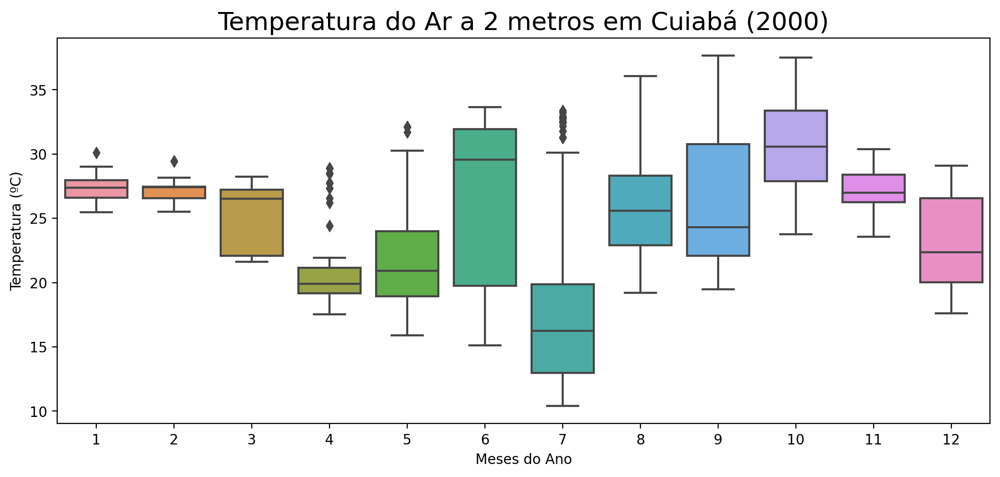

In [15]:
fig, ax = plt.subplots(figsize=(12,5))
sns.boxplot(x = df.Month,
                y = df['Temp2m'], 
                ax = ax)
plt.title("Temperatura do Ar a 2 metros em Cuiabá ("+ano+")", loc="center", fontsize=18)
plt.xlabel("Meses do Ano")
plt.ylabel("Temperatura (ºC)")

# ax = sns.stripplot(data = df, x='Precipitação (mm)', y='Temperatura (ºC)', hue="Temperatura (ºC)")  
fig.savefig('cuiaba_boxplot_prec_temp_ar-'+ano+'.png')

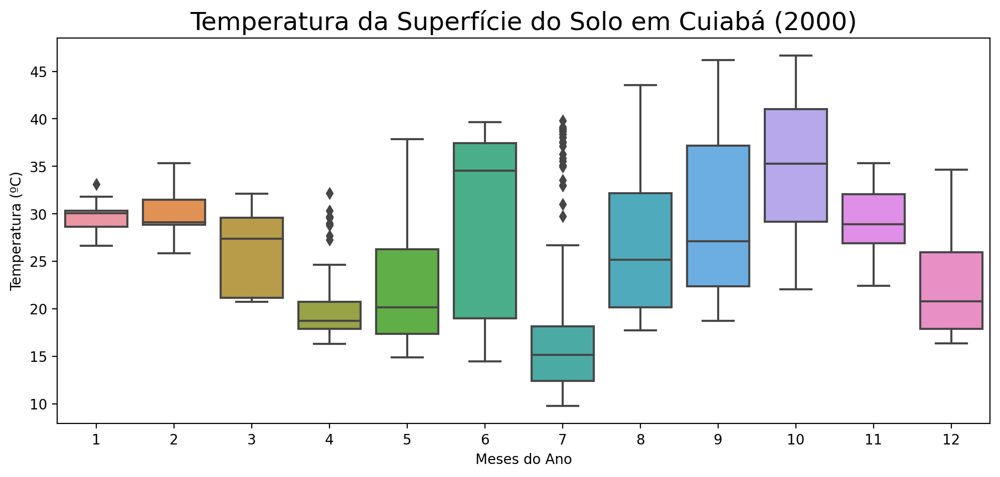

In [16]:
fig, ax = plt.subplots(figsize=(12,5))
sns.boxplot(x = df.Month,
                y = df['skinTemp'], 
                ax = ax)
plt.title("Temperatura da Superfície do Solo em Cuiabá ("+ano+")", loc="center", fontsize=18)
plt.xlabel("Meses do Ano")
plt.ylabel("Temperatura (ºC)")
# ax = sns.stripplot(data = df, x='Precipitação (mm)', y='Temperatura (ºC)', hue="Temperatura (ºC)")  
fig.savefig('cuiaba_boxplot_prec_skintemp-'+ano+'.png')

In [17]:
del df['date']
del df['longitude']
del df['latitude']
# del df['UHIp']
# del df['skinTemp']
# del df['Temp2m']
# del df['dewPoint']
# del df['total_precipitation']
del df['Day']
del df['Month']
del df['THI']
del df['UHI']
del df['HTI']
del df['Year']
del df['winddir']
del df['winddir_stat']
# del df['RH']
# del df['speed_x']
# del df['speed_y']
del df['Cidade']
del df['Região']
del df['UF']
# del df['total_evaporation']
# del df['windpower']
del df['timestamp']
del df['local']
# del df['UHIp2m']
del df['winddir_stat_name']
del df['skinTemp_mean']
del df['Temp2m_mean']
# del df['surface_pressure']
# del df['UHIn2m']
# del df['UTFVI2m']
del df['hour']

In [18]:
df['windquad'].value_counts()

5.0    942
1.0    474
8.0    471
4.0    330
2.0    180
3.0    171
7.0    153
6.0     45
Name: windquad, dtype: int64

In [19]:
quad = {
    1:'Primeiro',
    2:'Segundo', 
    3:'Terceiro',
    4:'Quarto',
    5:'Quinto',
    6:'Sexto',
    7:'Sétimo',
    8:'Oitavo'
}

df['windquad_cat'] = df['windquad'].map(quad) # re-mapping


In [20]:
# quad = {
#     1:0,
#     2:1, 
#     3:2,
#     4:3,
#     5:4,
#     6:5,
#     7:6,
#     8:7
# }

# df['windquad'] = df['windquad'].map(quad) # re-mapping

In [21]:
utfvi = {
    5:6,
    4:5, 
    3:4,
    2:3,
    1:2,
    0:1,
}

df['UHIn'] = df['UHIn'].map(utfvi) # re-mapping

In [22]:
df['windquad'] = df['windquad'].astype(int)

In [23]:
# df['UHIn2m'] = df['UHIn2m'].astype(int)
df['UHIn'] = df['UHIn'].astype(int)
# df['UHIn'] = df['UHIn'] -1 
df['UHIn'].value_counts()

4    2475
5     252
6      39
Name: UHIn, dtype: int64

In [24]:
# df['UHIt'] = df['UHIn'].apply(lambda x: 1 if x >= 4 else 0)
df['UHIt'] = df['UHIn'].apply(lambda x: 2 if x >= 4 else ( 1 if (x >= 2 and x <= 3) else 0))

In [25]:
df['windquad_cat'].value_counts()

Quinto      942
Primeiro    474
Oitavo      471
Quarto      330
Segundo     180
Terceiro    171
Sétimo      153
Sexto        45
Name: windquad_cat, dtype: int64

In [26]:
df['surface_pressure']

458       992.47550
479       991.94550
734       985.43030
813       100.19217
877       984.13330
            ...    
104509    990.14140
104579    988.10836
104619    989.73470
104746    991.41790
104747    991.26250
Name: surface_pressure, Length: 2766, dtype: float64

# Classifiers

To demonstrate classifier decision trees, we trying to model using six features to predict the boolean survived target.

In [27]:
df

,Temp2m,skinTemp,dewPoint,RH,windspeed,surface_pressure,windquad,UTFVI,UTFVI2m,windpower,UHIp,UHIn,UHIp2m,UHIn2m,windquad_cat,UHIt
458,20.406335,19.368738,19.408777,0.537326,6.248625,992.47550,5,0.012983,0.007189,1,forte,4,medio,2.0,Quinto,2
479,20.752649,19.689417,19.683069,0.536793,6.428343,991.94550,5,0.011372,0.007911,1,forte,4,medio,2.0,Quinto,2
734,28.909082,29.692499,22.767236,0.499757,7.025779,985.43030,5,0.011106,-0.000356,1,forte,4,nenhum,0.0,Quinto,2
813,10.658563,11.614771,5.106165,0.500056,18.847093,100.19217,5,0.010751,-0.000926,2,forte,4,nenhum,0.0,Quinto,2
877,27.535303,31.832666,23.327051,0.513715,10.365890,984.13330,1,0.013073,0.002232,1,forte,4,fraco,1.0,Primeiro,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104509,33.878748,37.651758,14.598352,0.413241,4.624342,990.14140,8,0.010212,0.004581,0,forte,4,fraco,1.0,Oitavo,2
104579,34.342401,41.403650,19.521356,0.441773,2.069200,988.10836,8,0.010401,0.002217,0,forte,4,fraco,1.0,Oitavo,2
104619,24.568445,25.496606,23.020837,0.533498,3.123307,989.73470,2,0.014304,0.003612,0,forte,4,fraco,1.0,Segundo,2
104746,32.259149,37.568201,12.962457,0.412361,7.136313,991.41790,1,0.010241,0.004474,1,forte,4,fraco,1.0,Primeiro,2


In [28]:
# df[['skinTemp','RH','windspeed','windquad','UHIp','UTFVI','windquad_cat','surface_pressure']].to_csv('../random_forest/era5_'+ano+'.csv')
df[['skinTemp','RH','windspeed','windquad','UHIp','windquad_cat','surface_pressure']].to_csv('../random_forest/era5_'+ano+'.csv')

In [29]:
quad = {
    1:0,
    2:1, 
    3:2,
    4:3,
    5:4,
    6:5,
    7:6,
    8:7
}

df['windquad'] = df['windquad'].map(quad) # re-mapping

In [30]:
UTFVI_label = "UHIp"   # Name of the classification target label
classes = list(df[UTFVI_label].unique())
df[UTFVI_label] = df[UTFVI_label].map(classes.index)
print(f"Target '{UTFVI_label}'' classes: {classes}")

Target 'UHIp'' classes: ['forte', 'muito_forte', 'extremo']


In [31]:
df['UHIp'].value_counts()

0    2475
1     252
2      39
Name: UHIp, dtype: int64

In [32]:
df

,Temp2m,skinTemp,dewPoint,RH,windspeed,surface_pressure,windquad,UTFVI,UTFVI2m,windpower,UHIp,UHIn,UHIp2m,UHIn2m,windquad_cat,UHIt
458,20.406335,19.368738,19.408777,0.537326,6.248625,992.47550,4,0.012983,0.007189,1,0,4,medio,2.0,Quinto,2
479,20.752649,19.689417,19.683069,0.536793,6.428343,991.94550,4,0.011372,0.007911,1,0,4,medio,2.0,Quinto,2
734,28.909082,29.692499,22.767236,0.499757,7.025779,985.43030,4,0.011106,-0.000356,1,0,4,nenhum,0.0,Quinto,2
813,10.658563,11.614771,5.106165,0.500056,18.847093,100.19217,4,0.010751,-0.000926,2,0,4,nenhum,0.0,Quinto,2
877,27.535303,31.832666,23.327051,0.513715,10.365890,984.13330,0,0.013073,0.002232,1,0,4,fraco,1.0,Primeiro,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104509,33.878748,37.651758,14.598352,0.413241,4.624342,990.14140,7,0.010212,0.004581,0,0,4,fraco,1.0,Oitavo,2
104579,34.342401,41.403650,19.521356,0.441773,2.069200,988.10836,7,0.010401,0.002217,0,0,4,fraco,1.0,Oitavo,2
104619,24.568445,25.496606,23.020837,0.533498,3.123307,989.73470,1,0.014304,0.003612,0,0,4,fraco,1.0,Segundo,2
104746,32.259149,37.568201,12.962457,0.412361,7.136313,991.41790,0,0.010241,0.004474,1,0,4,fraco,1.0,Primeiro,2


In [33]:
X = df[feat]
y = df['UHIp']

In [34]:
features = feat
target = 'UHIp'
# features
dataset_tf = tf.keras.pd_dataframe_to_tf_dataset(df[features + [target]], label=target)
model = tf.keras.RandomForestModel(max_depth=int(md), random_seed = random_state, task=Task.CLASSIFICATION)
model.fit(dataset_tf)

Use /tmp/tmpf31f4a6d as temporary training directory
Reading training dataset...


2024-02-20 14:02:14.989185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype double and shape [2766]
	 [[{{node Placeholder/_0}}]]


Training dataset read in 0:00:03.927742. Found 2766 examples.
Training model...
Model trained in 0:00:00.135693
Compiling model...


[INFO 24-02-20 14:02:19.0114 -04 kernel.cc:1242] Loading model from path /tmp/tmpf31f4a6d/model/ with prefix 870a87eba7224302
[INFO 24-02-20 14:02:19.0266 -04 decision_forest.cc:660] Model loaded with 300 root(s), 10634 node(s), and 3 input feature(s).
[INFO 24-02-20 14:02:19.0266 -04 abstract_model.cc:1311] Engine "RandomForestGeneric" built
[INFO 24-02-20 14:02:19.0266 -04 kernel.cc:1074] Use fast generic engine
2024-02-20 14:02:19.042490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype double and shape [2766]
	 [[{{node Placeholder/_0}}]]


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Model compiled.


## Initialize dtreeviz model (adaptor)

To adapt dtreeviz to a specific model, use the `model()` function to get an adaptor.  You'll need to provide the model, X/y data, feature names, target name, and target class names:

In [35]:
# model.summary()

In [36]:
# model.make_inspector().variable_importances()

In [37]:
# inspector = model.make_inspector()
# print("Model type:", inspector.model_type())
# print("Number of trees:", inspector.num_trees())
# print("Objective:", inspector.objective())
# print("Input features:", inspector.features())

In [38]:
viz_model = dtreeviz.model(model, tree_index=t_index,
                             X_train=df[features],
                             y_train=df[target],
                             feature_names=features,
                             target_name='Fenômeno ICU',
                             class_names=classes)

We'll use this model to demonstrate dtreeviz functionality in the following sections; the code will look the same for any decision tree library once we have this model adaptor.

## Tree structure visualizations
To show the decision tree structure using the default visualization, call `view()`:

In [39]:
v = viz_model.view(scale=2.1)
v.save("RF-IMAGES/classification/extremo/"+folder+"/"+"RF-UHIn x ALL-MD"+md+"-"+ano+".svg")

To change the visualization, you can pass parameters, such as changing the orientation to left-to-right:

In [40]:
# v = viz_model.view(orientation="LR",scale=2.1)
# v.save("RF-IMAGES/classification/extremo/"+folder+"/"+"RF-UHIn x ALL-LR-MD"+md+"-"+ano+".svg")

To visualize larger trees, you can reduce the amount of detail by turning off the fancy view:

In [39]:
# viz_model.view(fancy=False)

Another way to reduce the visualization size is to specify the tree depths of interest:

In [40]:
# v = viz_model.view(depth_range_to_display=(1, 2)) # root is level 0
# v.save("RF-IMAGES/classification/extremo/"+folder+"/"+"RF - UHIn - classification-MD"+md+"-range-"+ano+".svg")

## Prediction path explanations

For interpretation purposes, we often want to understand how a tree behaves for a specific instance. Let's pick a specific instance:

In [41]:
x = df[features].iloc[np.random.randint(0, len(df)),:].values
x

array([2.83374476, 6.        , 0.47759231])

and then display the path through the tree structure:

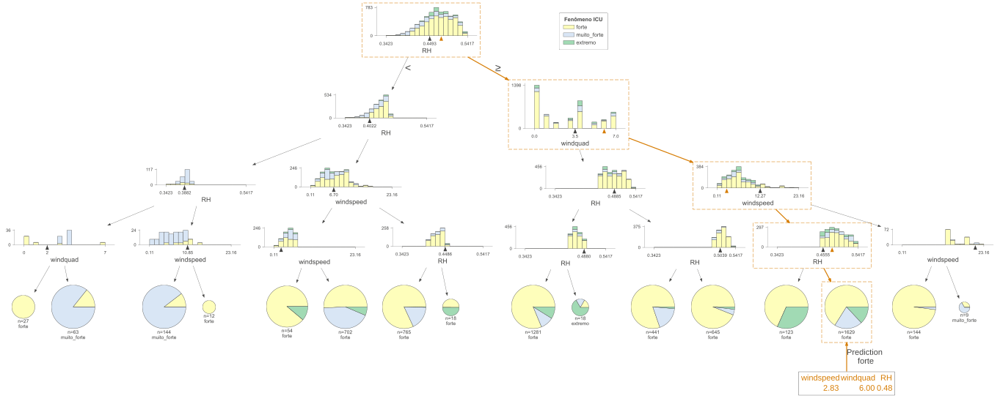

In [42]:
viz_model.view(x=x)
# v.save("RF-IMAGES/classification/extremo/"+folder+"/"+"RF - UHIn - classification-MD"+md+"-predict-"+ano+".svg")

In [43]:
# v = viz_model.view(x=x, show_just_path=True)
# v.save("RF-IMAGES/classification/extremo/"+folder+"/"+"RF - UHIn - classification-MD"+md+"-path-"+ano+".svg")

You can also get a string representation explaining the comparisons made as an instance is run down the tree:

In [44]:
print(viz_model.explain_prediction_path(x))

windspeed < 12.27
3.5 <= windquad 
0.46 <= RH 



# `Features` Importance

In [45]:
# # let's create a dictionary of features and their importance values
# feat_dict= {}
# for col, val in sorted(zip(X_train.columns, dt_hp.feature_importances_),key=lambda x:x[1],reverse=True):
#   feat_dict[col]=val

## Leaf info

There are a number of functions to get information about the leaves of the tree.

In [46]:
# viz_model.leaf_sizes()

In [47]:
# viz_model.ctree_leaf_distributions()

In [48]:
viz_model.node_stats(node_id=8).T

,count,mean,std,min,25%,50%,75%,max
windspeed,12.0,12.055588,1.429867,11.09816,11.255216,11.352451,12.152823,14.419287
windquad,12.0,0.5,0.522233,0.0,0.0,0.5,1.0,1.0
RH,12.0,0.397029,0.004133,0.390455,0.39597,0.398366,0.399425,0.40093


In [49]:
# v = viz_model.ctree_feature_space(features=['windspeed'], show={'splits','legend'}, figsize=(10,5))

In [50]:
# viz_model.ctree_feature_space(nbins=40, 
#                               gtype='barstacked', 
#                               show={'splits','title'}, 
#                               features=['windspeed','RH'],
#                               figsize=(10,5))

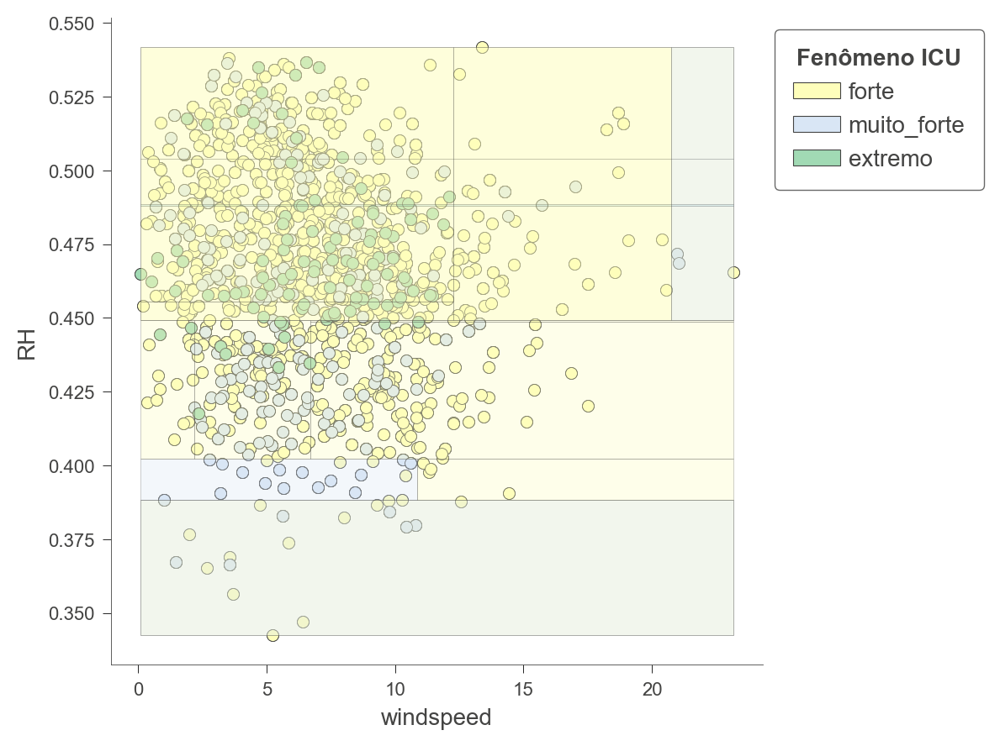

In [51]:
viz_model.ctree_feature_space(features=['windspeed','RH'], show={'splits','legend'}, figsize=(5,5))

In [52]:
# print(f"Available variable importances:")
# for importance in inspector.variable_importances().keys():
#   print("\t", importance)

In [53]:
# import matplotlib.pyplot as plt

# plt.figure(figsize=(12, 4))

# # Mean decrease in AUC of the class 1 vs the others.
# variable_importance_metric = "INV_MEAN_MIN_DEPTH"
# variable_importances = inspector.variable_importances()[variable_importance_metric]

# # Extract the feature name and importance values.
# #
# # `variable_importances` is a list of <feature, importance> tuples.
# feature_names = [vi[0].name for vi in variable_importances]
# feature_importances = [vi[1] for vi in variable_importances]
# # The feature are ordered in decreasing importance value.
# feature_ranks = range(len(feature_names))

# bar = plt.barh(feature_ranks, feature_importances, label=[str(x) for x in feature_ranks])
# plt.yticks(feature_ranks, feature_names)
# plt.gca().invert_yaxis()

# # TODO: Replace with "plt.bar_label()" when available.
# # Label each bar with values
# for importance, patch in zip(feature_importances, bar.patches):
#   plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{importance:.4f}", va="top")

# plt.xlabel(variable_importance_metric)
# plt.title("Mean decrease in AUC of the class 1 vs the others")
# plt.tight_layout()
# plt.show()

In [54]:
# viz_model.instance_feature_importance(x, figsize=(3.5,2))

# Inspect Individual Trees

In [55]:
# first_tree = inspector.extract_tree(tree_idx=5)
# print(first_tree.pretty())

In [56]:
import math
model.compile(metrics=["mse"])
evaluation = model.evaluate(dataset_tf, return_dict=True)

print(evaluation)
print()
print(f"MSE: {evaluation['mse']}")
print(f"RMSE: {math.sqrt(evaluation['mse'])}")

7/7 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mse: 0.5842
{'loss': 0.0, 'mse': 0.5841548442840576}

MSE: 0.5841548442840576
RMSE: 0.7643002317702499


In [57]:
inspector = model.make_inspector()
print("Model type:", inspector.model_type())
print("Number of trees:", inspector.num_trees())
print("Objective:", inspector.objective())
print("Input features:", inspector.features())

Model type: RANDOM_FOREST
Number of trees: 300
Objective: Classification(label=__LABEL, class=None, num_classes=3)
Input features: ["RH" (1; #0), "windquad" (1; #2), "windspeed" (1; #3)]


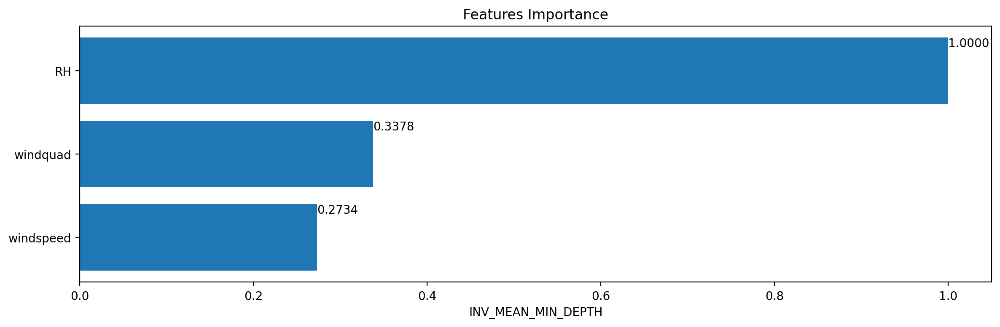

In [58]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 4))
# Mean decrease in AUC of the class 1 vs the others.
variable_importance_metric = "INV_MEAN_MIN_DEPTH"
variable_importances = inspector.variable_importances()[variable_importance_metric]
# Extract the feature name and importance values.
#
# `variable_importances` is a list of <feature, importance> tuples.
feature_names = [vi[0].name for vi in variable_importances]
feature_importances = [vi[1] for vi in variable_importances]
# The feature are ordered in decreasing importance value.
feature_ranks = range(len(feature_names))
bar = plt.barh(feature_ranks, feature_importances, label=[str(x) for x in feature_ranks])
plt.yticks(feature_ranks, feature_names)
plt.gca().invert_yaxis()
# TODO: Replace with "plt.bar_label()" when available.
# Label each bar with values
for importance, patch in zip(feature_importances, bar.patches):
    plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{importance:.4f}", va="top")
plt.xlabel(variable_importance_metric)## 
plt.title("Features Importance")
plt.tight_layout()
plt.show()

In [59]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42, stratify=y)

In [60]:
# import Random Forest classifier
from sklearn.ensemble import RandomForestClassifier
# instantiate the classifier
rf = RandomForestClassifier(random_state=42, max_depth=int(md))
# fit the model
rf.fit(X_train, y_train)
# Predict the Test set results
y_pred = rf.predict(X_test)
# Check accuracy score
from sklearn.metrics import accuracy_score
print('Model accuracy score with 10 decision-trees : {0:0.4f}'.format(accuracy_score(y_test, y_pred)))

Model accuracy score with 10 decision-trees : 0.7647


In [61]:
# # Extract single tree
# estimator = rf.estimators_[5]

# from sklearn.tree import export_graphviz
# # Export as dot file
# export_graphviz(estimator, out_file='tree.dot', 
#                 feature_names = df[features],
#                 class_names = df[target],
#                 rounded = True, proportion = False, 
#                 precision = 2, filled = True)

# # Convert to png using system command (requires Graphviz)
# from subprocess import call
# call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# # Display in jupyter notebook
# from IPython.display import Image
# Image(filename = 'tree.png')

In [62]:
#HABILITAR SOMENTE PARA ENCONTRAR OS MELHORES PARÂMETROS
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [200, 300, 500],
    'max_features': ['sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [63]:
CV_rfc = GridSearchCV(estimator=rf, param_grid=param_grid, cv= 5)
# CV_rfc.fit(X_train, y_train)
# print(CV_rfc.cv_results_)
# print(CV_rfc.best_params_)
# print(CV_rfc.best_estimator_)

In [64]:
rfc1=RandomForestClassifier(random_state=random_state, max_features='sqrt', n_estimators= 500, max_depth=int(md), criterion='entropy')
rfc1.fit(X_train, y_train)

pred=rfc1.predict(X_test)
print("Accuracy for Random Forest on CV data: ",accuracy_score(y_test,pred))

Accuracy for Random Forest on CV data:  0.7652221612726275


In [65]:
def plot_search_results(grid):
    """
    Params:
    grid: A trained GridSearchCV object.
    """
    ## Results from grid search
    results = grid.cv_results_
    means_test = results['mean_test_score']
    stds_test = results['std_test_score']
    means_train = results['mean_score_time']
    stds_train = results['std_score_time']
    ## Getting indexes of values per hyper-parameter
    masks=[]
    masks_names= list(grid.best_params_.keys())
    for p_k, p_v in grid.best_params_.items():
        masks.append(list(results['param_'+p_k].data==p_v))
    params=grid.param_grid
    ## Ploting results
    fig, ax = plt.subplots(1,len(params),sharex='none',sharey='all',figsize=(20,5))
    fig.suptitle('Score per parameter')
    fig.text(0.04, 0.5, 'MEAN SCORE', va='center', rotation='vertical')
    pram_preformace_in_best = {}
    for i, p in enumerate(masks_names):
        m = np.stack(masks[:i] + masks[i+1:])
        pram_preformace_in_best
        best_parms_mask = m.all(axis=0)
        best_index = np.where(best_parms_mask)[0]
        x = np.array(params[p])
        y_1 = np.array(means_test[best_index])
        e_1 = np.array(stds_test[best_index])
        y_2 = np.array(means_train[best_index])
        e_2 = np.array(stds_train[best_index])
        ax[i].errorbar(x, y_1, e_1, linestyle='--', marker='o', label='test')
        ax[i].errorbar(x, y_2, e_2, linestyle='-', marker='^',label='train' )
        ax[i].set_xlabel(p.upper())
    plt.legend()
    plt.show()

In [66]:
# plot_search_results(CV_rfc)

In [67]:
import seaborn as sns
def plot_cv_results(cv_results, param_x, param_z, metric='rank_test_score'):
    """
    cv_results - cv_results_ attribute of a GridSearchCV instance (or similar)
    param_x - name of grid search parameter to plot on x axis
    param_z - name of grid search parameter to plot by line color
    """
    cv_results = pd.DataFrame(cv_results)
    col_x = 'param_' + param_x
    col_z = 'param_' + param_z
    fig, ax = plt.subplots(1, 1, figsize=(11, 8))
    sns.pointplot(x=col_x, y=metric, hue=col_z, data=cv_results, errorbar=('ci', 99), n_boot=64, ax=ax)
    ax.set_title("CV Grid Search Results")
    ax.set_xlabel(param_x)
    ax.set_ylabel(metric)
    ax.legend(title=param_z)
    return fig

In [68]:
from sklearn.model_selection import RandomizedSearchCV
rf_RandomGrid = RandomizedSearchCV(estimator = rf, param_distributions = param_grid, cv = 10, verbose=2, n_jobs = 4)
rf_RandomGrid.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=10,
                   estimator=RandomForestClassifier(max_depth=5,
                                                    random_state=42),
                   n_jobs=4,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [4, 5, 6, 7, 8],
                                        'max_features': ['sqrt', 'log2'],
                                        'n_estimators': [200, 300, 500]},
                   verbose=2)

In [69]:
print (f'Train Accuracy - : {rf_RandomGrid.score(X_train,y_train):.3f}')
print (f'Test Accuracy - : {rf_RandomGrid.score(X_test,y_test):.3f}')

Train Accuracy - : 0.870
Test Accuracy - : 0.848


In [70]:
rf_RandomGrid.best_params_

{'n_estimators': 300,
 'max_features': 'sqrt',
 'max_depth': 8,
 'criterion': 'entropy'}

In [71]:
esti = rf_RandomGrid.best_estimator_.n_estimators
mf = rf_RandomGrid.best_estimator_.max_features
md = rf_RandomGrid.best_estimator_.max_depth
crit = rf_RandomGrid.best_estimator_.criterion
esti,mf,md,crit

(300, 'sqrt', 8, 'entropy')

In [72]:
# instantiate the classifier with n_estimators = 100
rfc_100 = RandomForestClassifier(n_estimators=esti, max_depth=md, random_state=42, max_features=mf, criterion=crit)
# fit the model to the training set
rfc_100.fit(X_train, y_train)
# Predict on the test set results
y_pred_100 = rfc_100.predict(X_test)
# Check accuracy score
print('Model accuracy score with 500 decision-trees : {0:0.4f}'.format(accuracy_score(y_test, y_pred_100)))

Model accuracy score with 500 decision-trees : 0.8481


In [73]:
pred=rfc1.predict(X_test)
print("Accuracy for Random Forest on CV data: {0:0.4f} ".format(accuracy_score(y_test,pred)))

Accuracy for Random Forest on CV data: 0.7652 


In [74]:
# view the feature scores
feature_scores = pd.Series(rfc1.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_scores

RH           0.501001
windspeed    0.283824
windquad     0.215175
dtype: float64

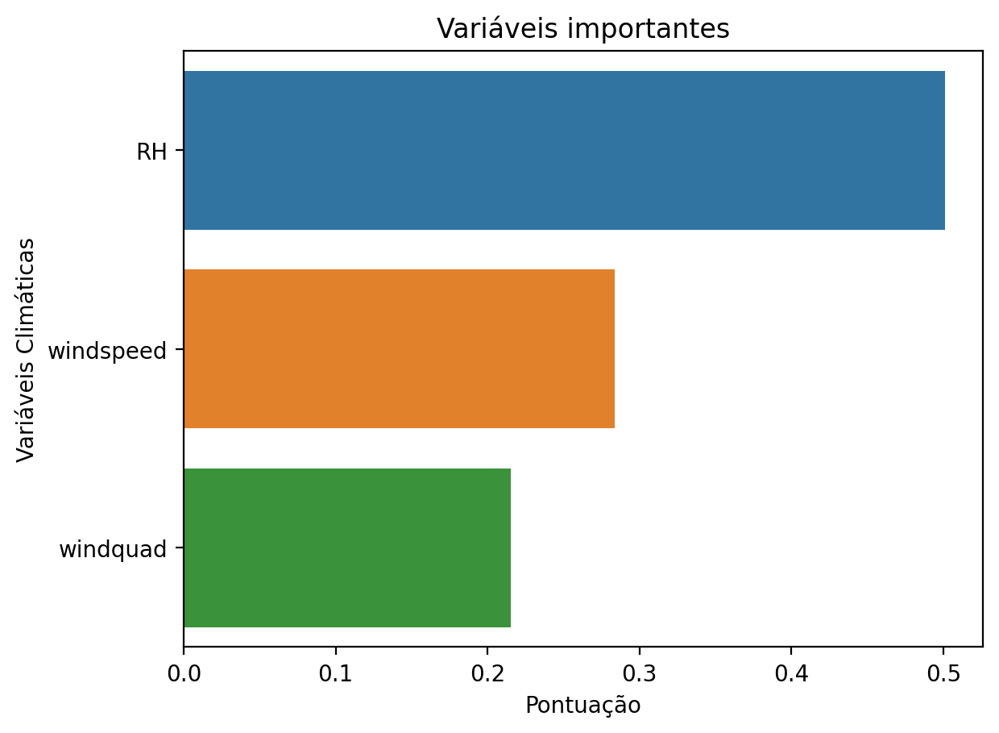

In [75]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# Creating a seaborn bar plot
sns.barplot(x=feature_scores, y=feature_scores.index)
# Add labels to the graph
plt.xlabel('Pontuação')
plt.ylabel('Variáveis Climáticas')
# Add title to the graph
plt.title("Variáveis importantes")
# Visualize the graph
plt.show()

In [76]:
# split data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30,random_state = 42)

In [77]:
# instantiate the classifier with n_estimators = 100
clf = RandomForestClassifier(random_state=random_state)
# fit the model to the training set
clf.fit(X_train, y_train)
# Predict on the test set results
y_pred = clf.predict(X_test)
# Check accuracy score
print('Model accuracy score with doors variable removed : {0:0.4f}'.format(accuracy_score(y_test, y_pred)))

Model accuracy score with doors variable removed : 0.9923


In [78]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1337
           1       0.99      0.99      0.99       354
           2       0.98      0.95      0.97       132

    accuracy                           0.99      1823
   macro avg       0.99      0.98      0.98      1823
weighted avg       0.99      0.99      0.99      1823



In [79]:
from sklearn.ensemble import RandomForestClassifier # from xgboost import XGBClassifier
model = RandomForestClassifier() # XGBClassifier()
model.fit(X, y)
pd.DataFrame({'Variable':X.columns, 'Importance':model.feature_importances_}).sort_values('Importance', ascending=False)

,Variable,Importance
2,RH,0.500950
0,windspeed,0.414531
1,windquad,0.084519


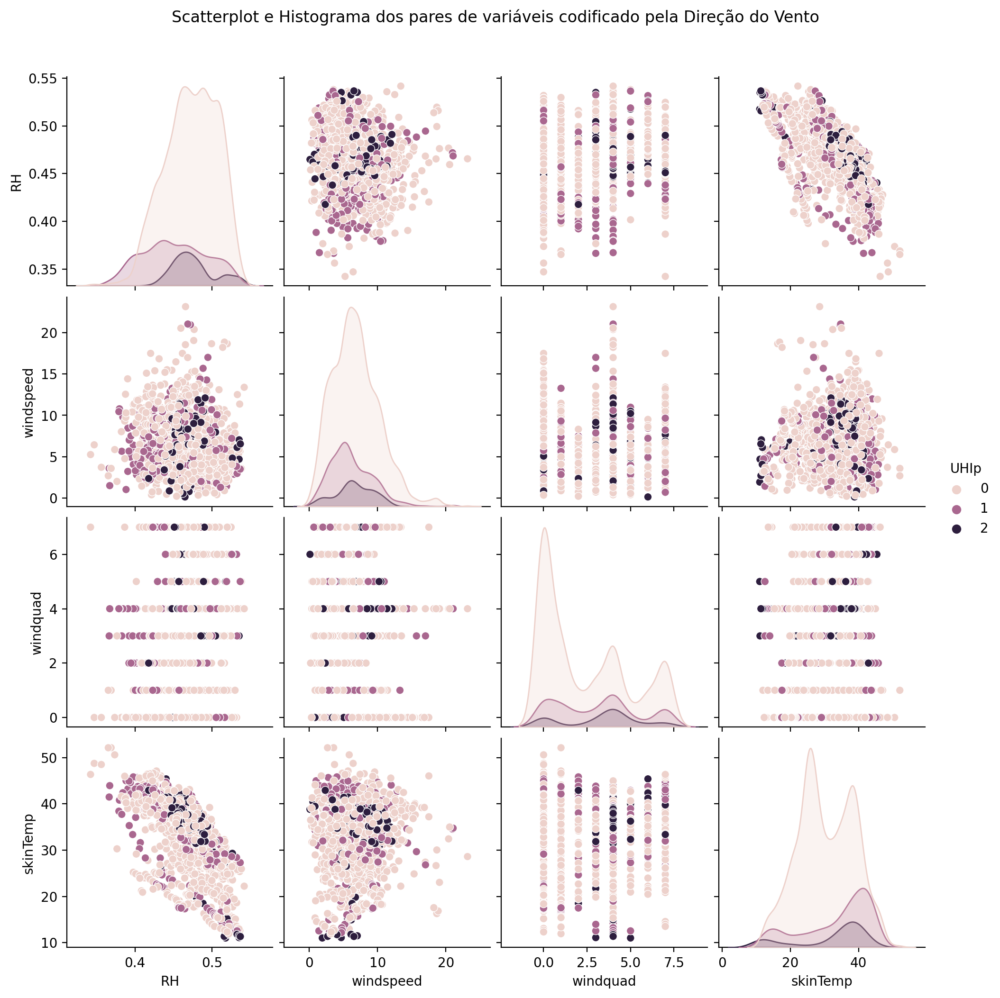

In [80]:
g = sns.pairplot(df[['UHIp','RH','windspeed','windquad','skinTemp']], hue='UHIp')
g.fig.suptitle("Scatterplot e Histograma dos pares de variáveis codificado pela Direção do Vento",y=1.05);

In [81]:
# shap.dependence_plot('RH', shap_values, X_train)

In [82]:
X = df[feat] #drop(['windquad','windquad_cat','dewPoint','surface_pressure','skinTemp','UTFVI','windpower' ,axis=1)
y = df['UHIp']
X,y

(        windspeed  windquad        RH
 42      10.063910         7  0.416705
 55       2.074070         6  0.452193
 56       1.952335         5  0.442753
 57       4.049349         5  0.439298
 58       5.911892         4  0.437305
 ...           ...       ...       ...
 104728  11.251276         0  0.417825
 104729  10.319567         0  0.414366
 104750   6.286902         0  0.444720
 104751   8.609096         0  0.425917
 104800   3.702902         0  0.356289
 
 [6075 rows x 3 columns],
 42        0
 55        0
 56        0
 57        0
 58        0
          ..
 104728    0
 104729    0
 104750    0
 104751    0
 104800    0
 Name: UHIp, Length: 6075, dtype: int64)

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model = RandomForestClassifier(n_estimators=500, max_depth=int(md), max_features='sqrt', random_state=random_state, criterion='gini')
# Fit RandomForestClassifier
rfc = model.fit(X_train, y_train)
# Predict the test set labels
# y_pred = rfc.predict(X_test)
print('o R² do treino é: %.2f'% rfc.score(X_train, y_train))

o R² do treino é: 0.86


In [84]:
#prediction of the training data
ytrain_pred = rfc.predict(X_train)
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.20
Mean Squared Error: 0.33
Root Mean Squared Error: 0.57
Explained Variance Score: 0.25


In [85]:
#Prediction on the testing data
ytest_pred = rfc.predict(X_test)
#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred))
print('O R² do Teste é: %.2f'% rfc.score(X_test, y_test))

O R² do Teste é: 0.10
O R² do Teste é: 0.85


In [86]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, y_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, y_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, y_pred))

Mean Absolute Error: 0.01
Mean Squared Error: 0.02
Root Mean Squared Error: 0.13
Explained Variance Score: 0.95


In [87]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

Mean Absolute Error: 0.21
Mean Squared Error: 0.33
Root Mean Squared Error: 0.57
Explained Variance Score: 0.22


In [88]:
y_test

12124    0
50757    0
76576    0
58525    0
77395    0
        ..
79531    1
6362     0
57323    0
32586    1
5822     0
Name: UHIp, Length: 1823, dtype: int64

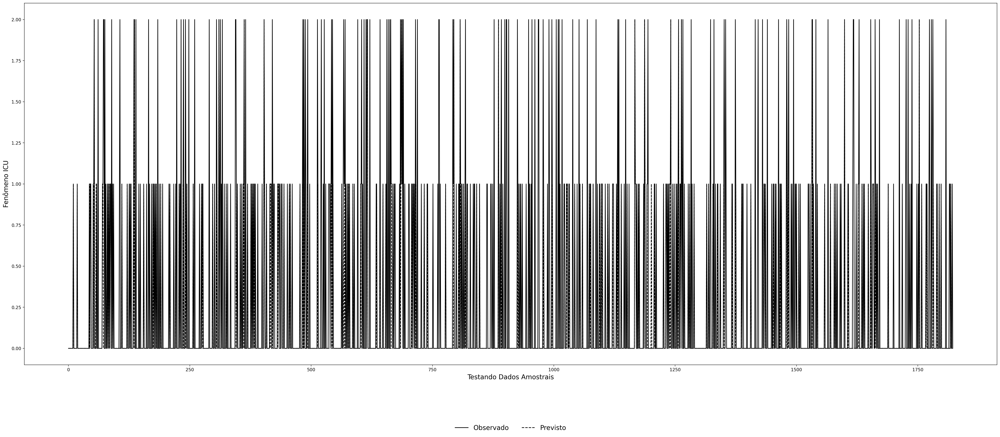

In [89]:
# Plotting the observed and predicted data
import matplotlib.pyplot as plt
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (40,15)
x_ax = range(len(X_test))
# Plotting
plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
plt.ylabel('Fenômeno ICU', fontsize=15)
plt.xlabel('Testando Dados Amostrais',fontsize=15)
plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon =
False,fontsize=15)
# plt.show()
plt.savefig("RF-IMAGES/classification/extremo/"+folder+"/"+"RF-WINDQUADxall-MD"+str(md)+"-"+ano+".png")

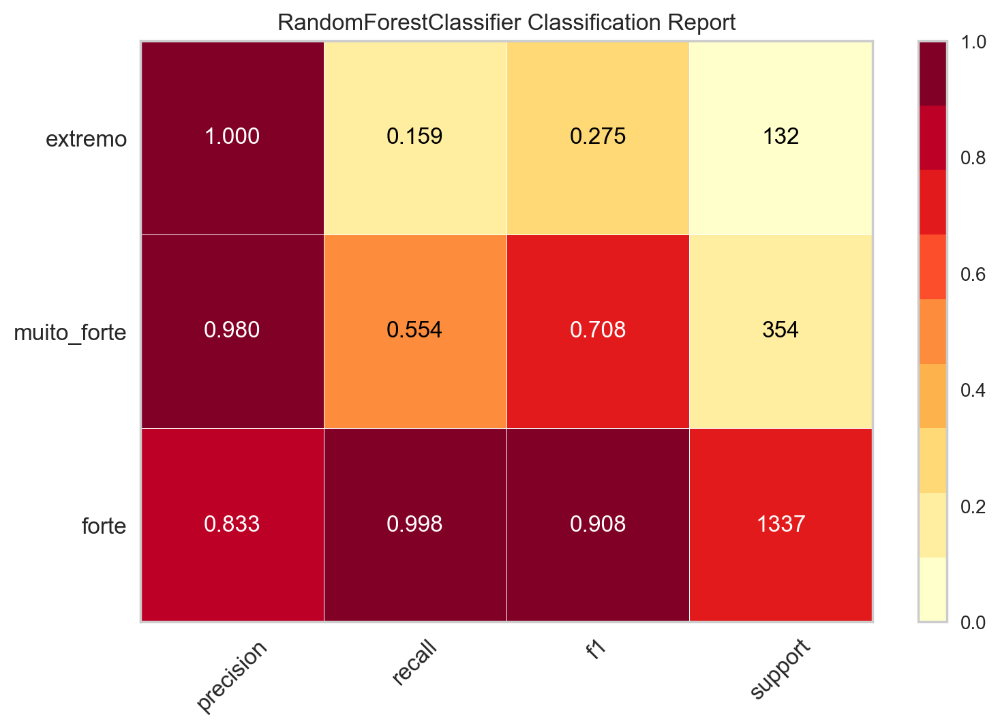

<AxesSubplot: title={'center': 'RandomForestClassifier Classification Report'}>

In [90]:
#Plotting the classification errors and residuals
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (7,4)
from yellowbrick.classifier import ClassificationReport
visualizer = ClassificationReport(rfc,classes=classes, support=True)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

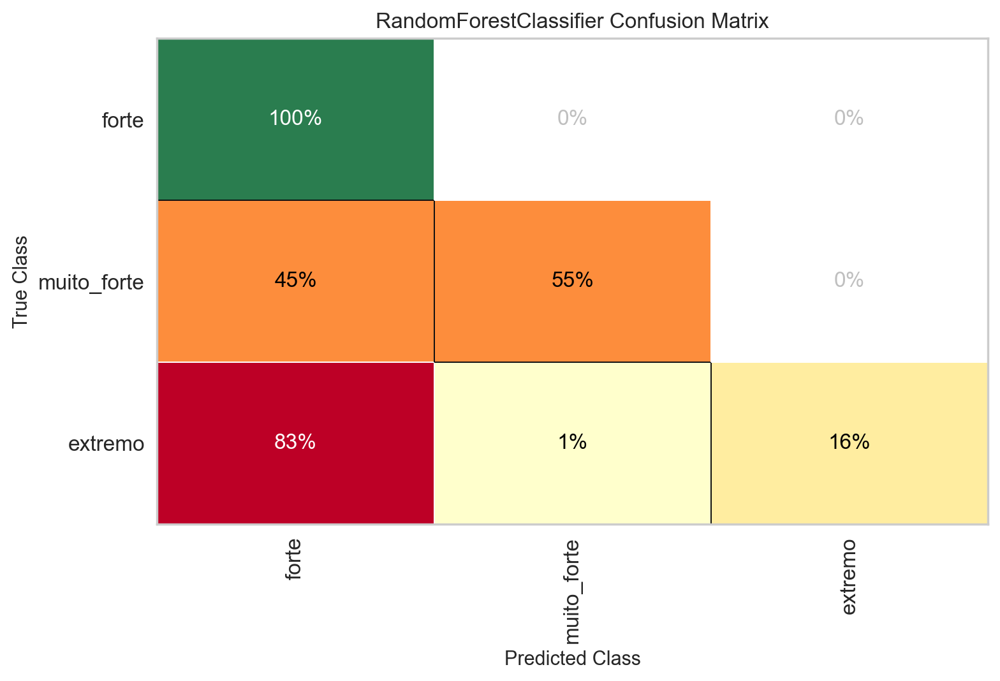

In [91]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix( rfc, 
                     classes=classes, 
                     percent=True
                     #label_encoder={0: 'Forte', 1: 'Muito Forte', 2: 'Extremo'}
)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

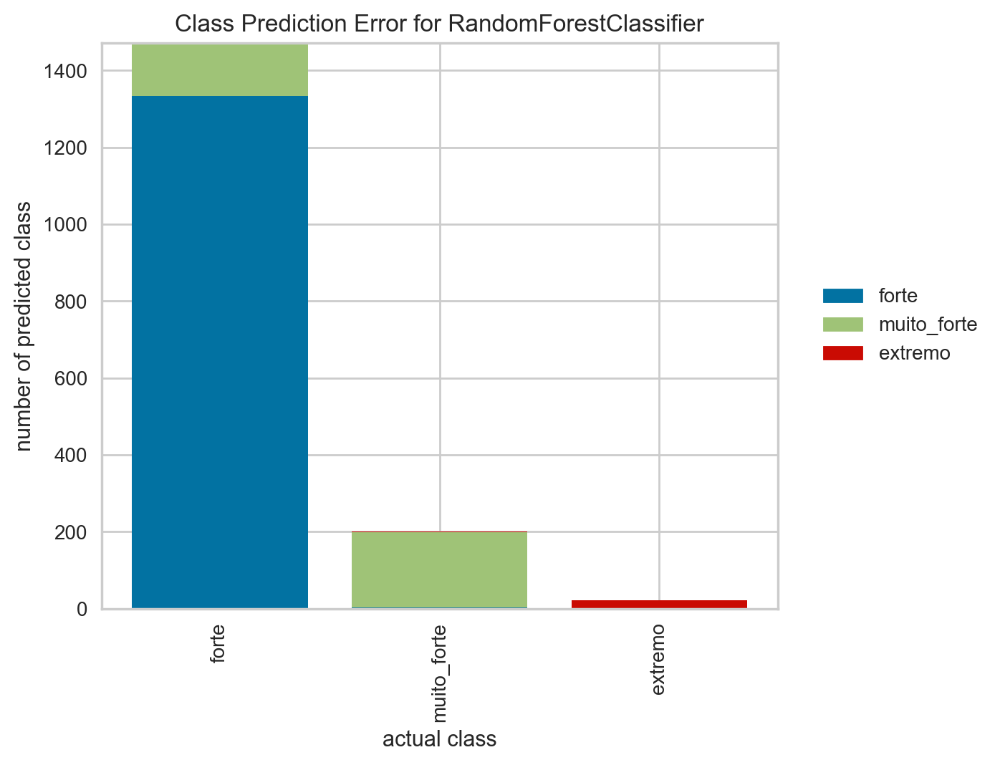

In [92]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(rfc, classes=classes)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

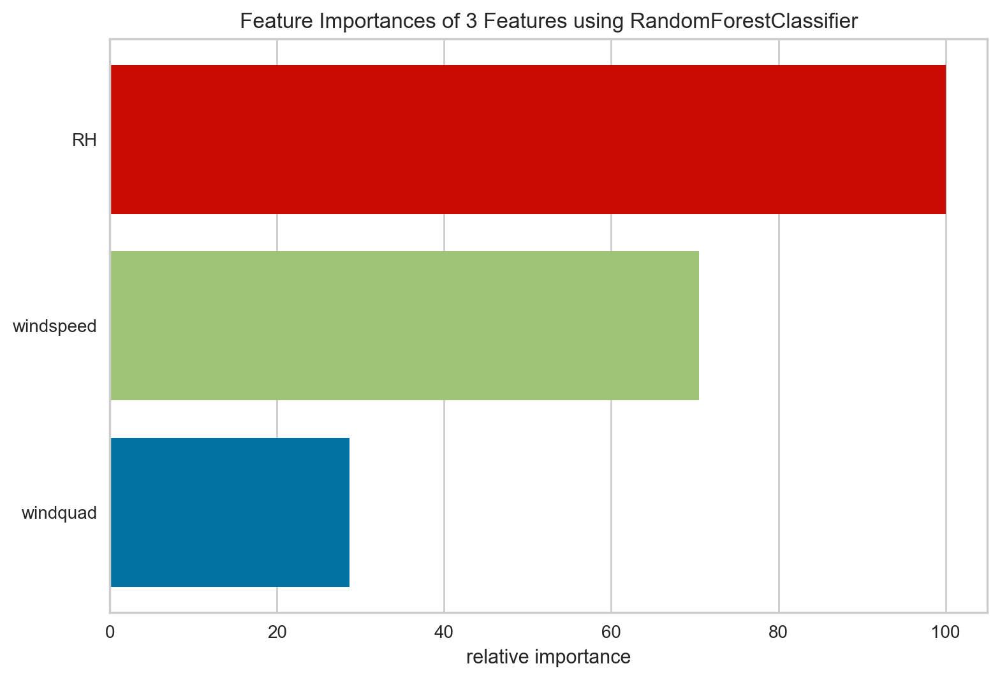

In [93]:
from yellowbrick.model_selection import FeatureImportances
from sklearn.ensemble import RandomForestClassifier
visualizer = FeatureImportances(rfc)
visualizer.fit(X_train, y_train)
visualizer.show();

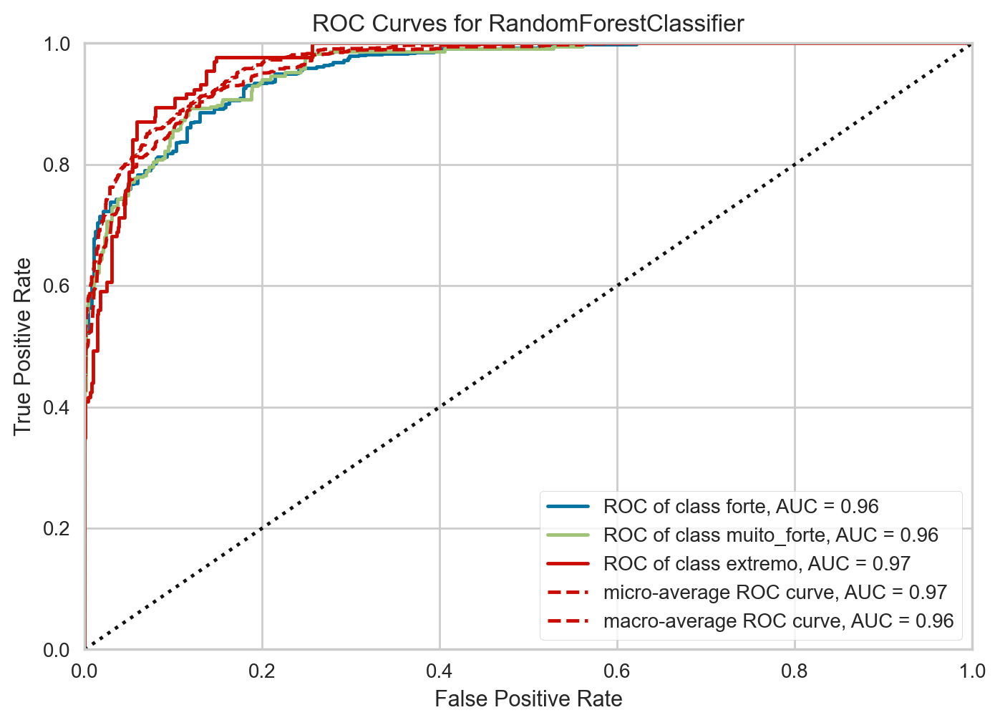

In [94]:
from yellowbrick.classifier import ROCAUC
# from sklearn.linear_model import LogisticRegression
# X, y = load_spam()
# X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
# model = LogisticRegression(max_iter=10000)
# model.fit(X_train, y_train)
visualizer = ROCAUC(rfc, classes = classes) #['Segundo', 'Oitavo', 'Primeiro', 'Sétimo', 'Terceiro', 'Quarto', 'Quinto', 'Sexto'])
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show();

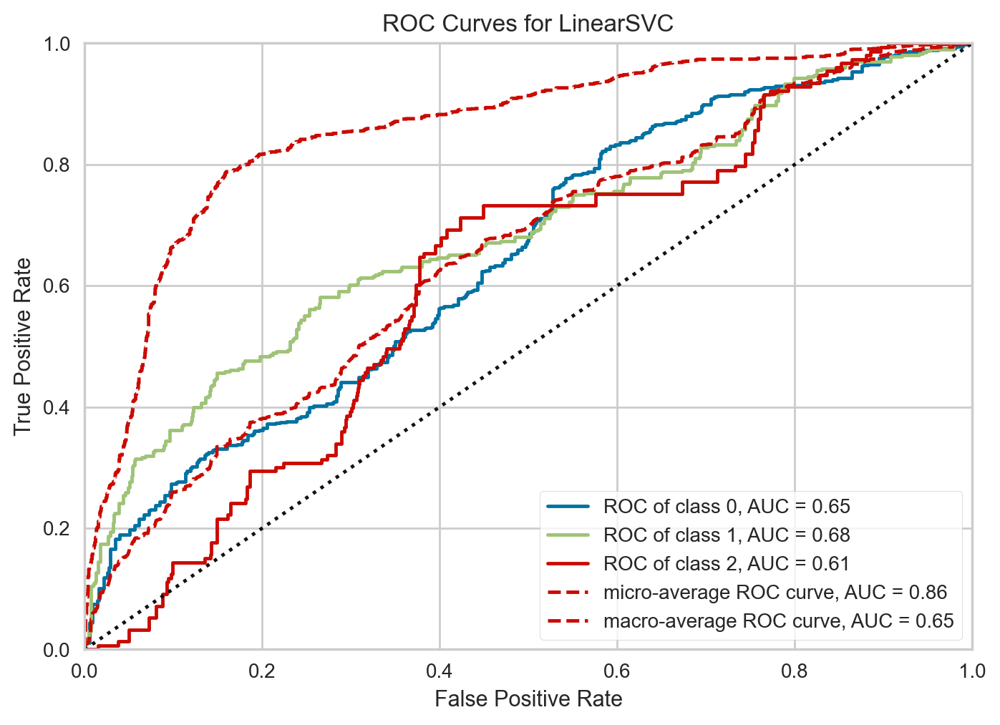

<AxesSubplot: title={'center': 'ROC Curves for LinearSVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [95]:
from sklearn.svm import LinearSVC
from yellowbrick.classifier import ROCAUC
model = LinearSVC()
visualizer = ROCAUC(model)
visualizer.fit(X,y)
visualizer.score(X,y)
visualizer.show()

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1337
           1       0.99      0.99      0.99       354
           2       0.98      0.95      0.97       132

    accuracy                           0.99      1823
   macro avg       0.99      0.98      0.98      1823
weighted avg       0.99      0.99      0.99      1823



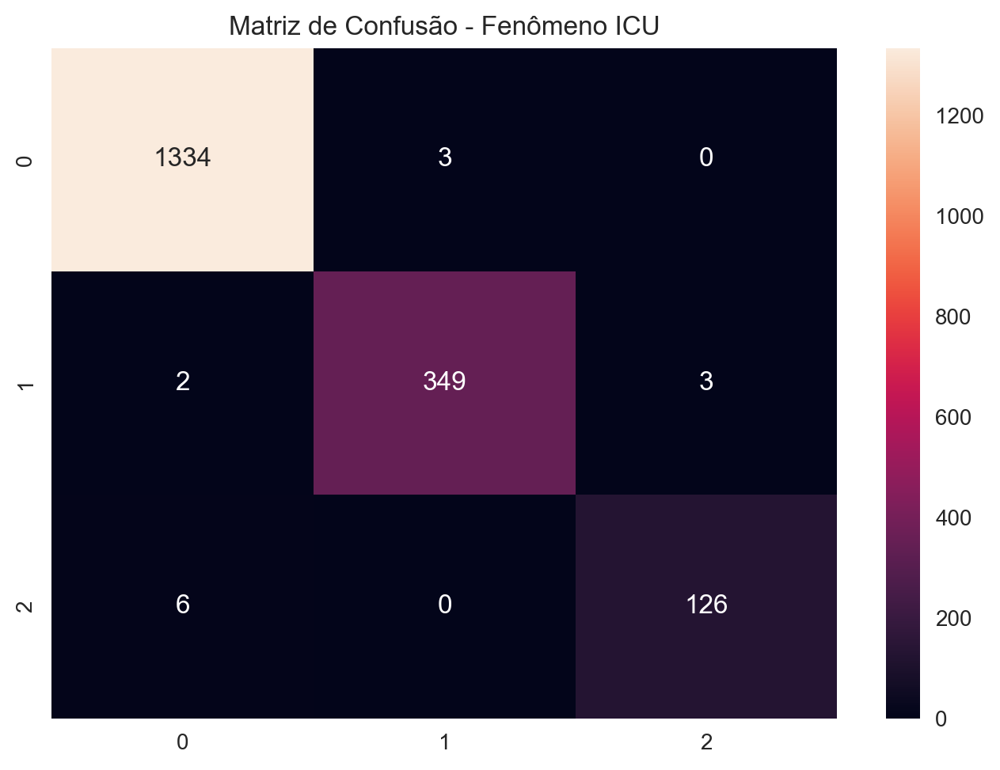

In [96]:
from sklearn.metrics import classification_report, confusion_matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d').set_title('Matriz de Confusão - Fenômeno ICU')
print(classification_report(y_test,y_pred))

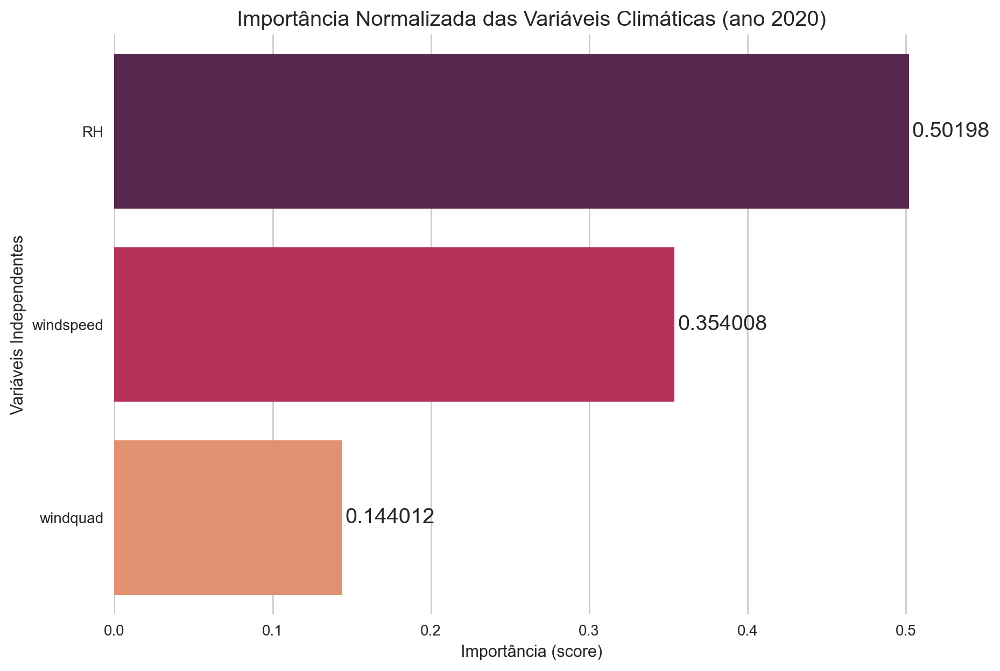

In [97]:
# # Organizing feature names and importances in a DataFrame
# features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })
# # Sorting data from highest to lowest
# features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# # Barplot of the result without borders and axis lines
# g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
# sns.despine(bottom = True, left = True)
# g.set_title('Importância das Variáveis Climáticas')
# g.set(xlabel=None)
# g.set(ylabel=None)
# g.set(xticks=[])
# for value in g.containers:
#     g.bar_label(value, padding=2)
# # plt.savefig('importance features '+ano)
# plt.savefig("RF-IMAGES/classification/extremo/"+folder+"/"+"RF-WINDQUADxall-MD"+str(md)+"-"+ano+".png"))
plt.rcParams['figure.figsize'] = (10,7)
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc.feature_names_in_, 'importances': rfc.feature_importances_ })
# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
sns.set(font_scale=1.2)
g.set_title('Importância Normalizada das Variáveis Climáticas (ano '+ano+')')
g.set(xlabel='Importância (score)')
g.set(ylabel='Variáveis Independentes')
# g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)
plt.savefig("RF-IMAGES/classification/extremo/"+folder+"/"+"RF-Importance_Features-"+ano+".png")

In [98]:
rfc_ = RandomForestClassifier(n_estimators=500, max_depth=int(md),random_state=random_state,criterion='gini')
rfc_.fit(X_train, y_train)
y_pred = rfc_.predict(X_test)

In [99]:
regc = rfc_.fit(X_train, y_train)
print('o R² do treino é: %.2f'% regc.score(X_train, y_train))

o R² do treino é: 0.86


In [100]:
regc = rfc_.fit(X_test, y_test)
print('o R² do teste é: %.2f'% regc.score(X_test, y_test))

o R² do teste é: 0.83


              precision    recall  f1-score   support

           0       0.83      1.00      0.91      1337
           1       0.98      0.55      0.71       354
           2       1.00      0.16      0.27       132

    accuracy                           0.85      1823
   macro avg       0.94      0.57      0.63      1823
weighted avg       0.87      0.85      0.82      1823



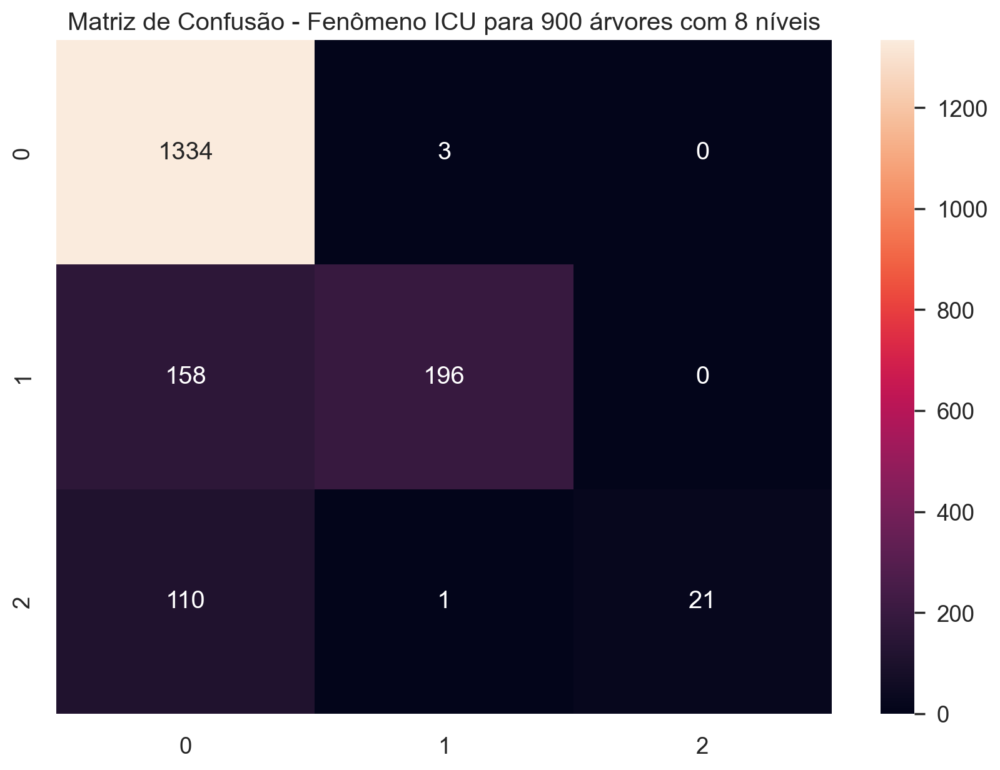

In [101]:
cm_ = confusion_matrix(y_test, y_pred)
sns.heatmap(cm_, annot=True, fmt='d').set_title('Matriz de Confusão - Fenômeno ICU para 900 árvores com 8 níveis')
print(classification_report(y_test,y_pred))

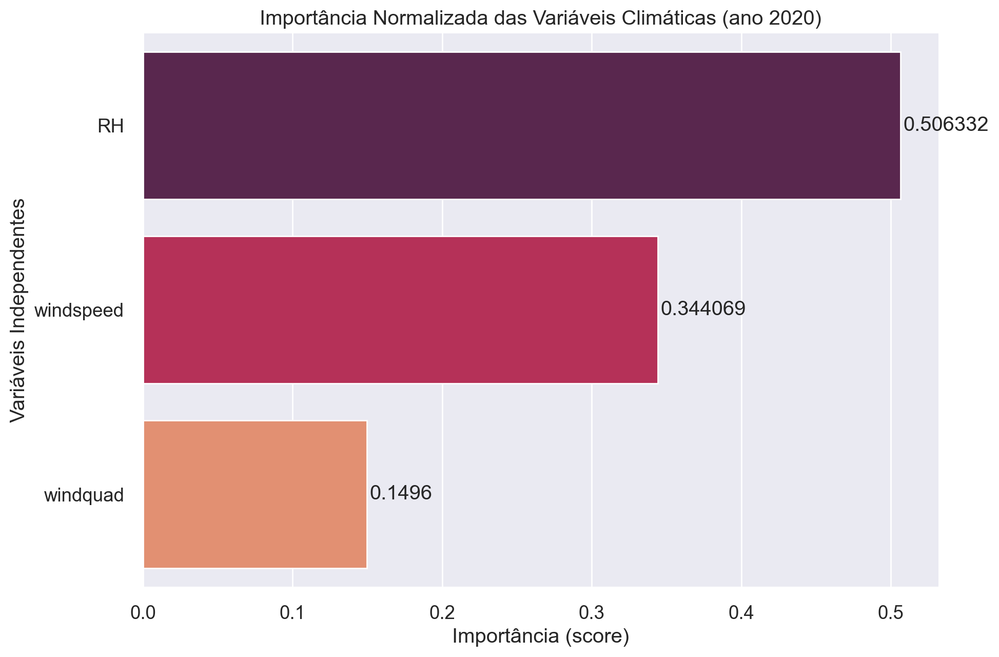

In [102]:
plt.rcParams['figure.figsize'] = (10,7)
# Organizing feature names and importances in a DataFrame
features_df = pd.DataFrame({'features': rfc_.feature_names_in_, 'importances': rfc_.feature_importances_ })
# Sorting data from highest to lowest
features_df_sorted = features_df.sort_values(by='importances', ascending=False)
# Barplot of the result without borders and axis lines
g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Importância Normalizada das Variáveis Climáticas (ano '+ano+')')
g.set(xlabel='Importância (score)')
g.set(ylabel='Variáveis Independentes')
# g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)
plt.savefig('importance features '+ano)

In [103]:
y = df[target]
X = df[feat] #.drop(['UHIn','UTFVI2m','dewPoint','surface_pressure','windquad_cat','skinTemp','UTFVI','windpower'], axis=1)
y

42        0
55        0
56        0
57        0
58        0
         ..
104728    0
104729    0
104750    0
104751    0
104800    0
Name: UHIp, Length: 6075, dtype: int64

In [104]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [105]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=500, 
                              max_depth=int(md), 
                              random_state=random_state,
                              max_features='log2',
                              criterion='poisson')
# rfr.fit(X_train, y_train)
# y_pred = rfr.predict(X_test)

In [106]:
reg = model.fit(X_train, y_train)
print('o R² do treino é: %.2f'% reg.score(X_train, y_train))

o R² do treino é: 0.46


In [107]:
ytrain_pred = reg.predict(X_train)
y_pred = reg.predict(X_test)
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.34
Mean Squared Error: 0.20
Root Mean Squared Error: 0.45
Explained Variance Score: 0.46


In [108]:
#Prediction on the testing data
ytest_pred = reg.predict(X_test)
#the testing coef of determination
print('O R² do Teste é: %.2f'% r2_score(y_test, ytest_pred))
print('O R² do Teste é: %.2f'% reg.score(X_test, y_test))

O R² do Teste é: 0.41
O R² do Teste é: 0.41


In [109]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test,ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test,ytest_pred))

Mean Absolute Error: 0.35
Mean Squared Error: 0.22
Root Mean Squared Error: 0.47
Explained Variance Score: 0.41


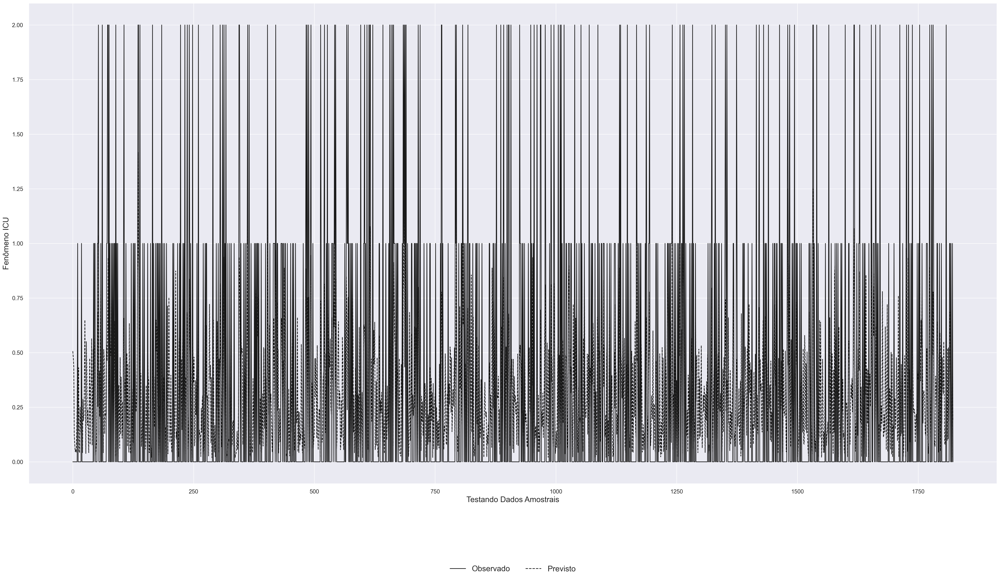

In [110]:
# Plotting the observed and predicted data
import matplotlib.pyplot as plt
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (40,20)
x_ax = range(len(X_test))
# Plotting
plt.plot(x_ax, y_test, label='Observado', color = 'k', linestyle = '-')
plt.plot(x_ax, ytest_pred, label = 'Previsto', color = 'k', linestyle = '--')
plt.ylabel('Fenômeno ICU',fontsize=18)
plt.xlabel('Testando Dados Amostrais',fontsize=18)
plt.legend(bbox_to_anchor = (0.5, -0.2), loc = 'lower center', ncol = 2, frameon = False,fontsize=18)
plt.show()

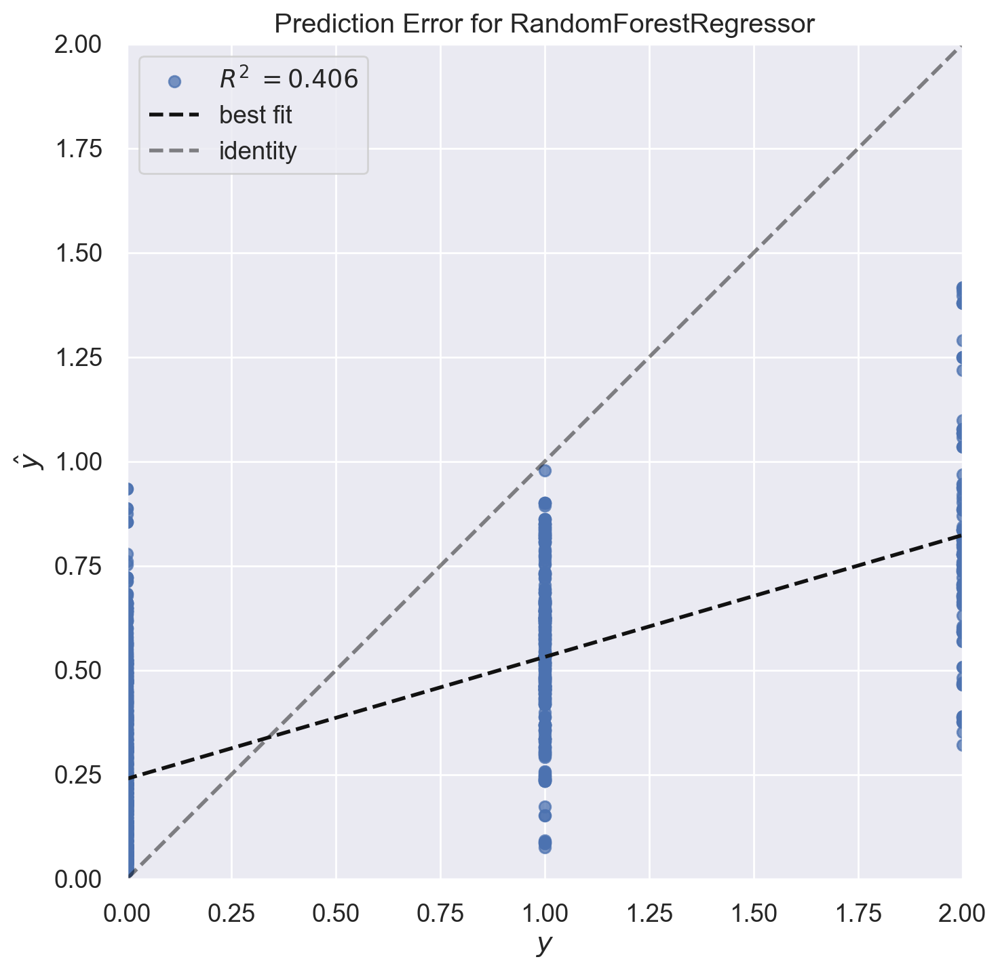

<AxesSubplot: title={'center': 'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [111]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (15,8)
#Plotting the prediction errors and residuals
from yellowbrick.regressor import PredictionError
visualizer = PredictionError(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

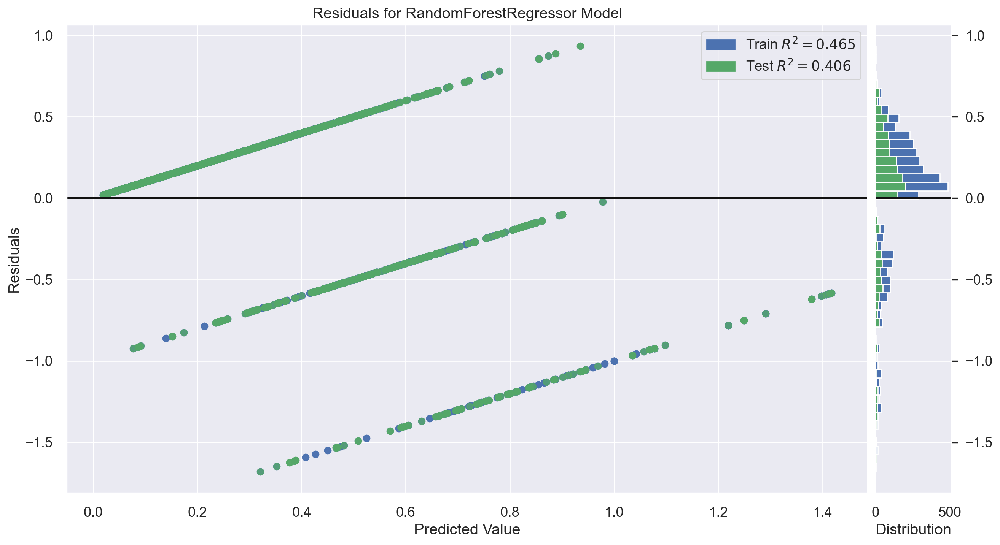

<AxesSubplot: title={'center': 'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [112]:
# Plotting the residuals
plt.rcParams['figure.figsize'] = (15,8)
from yellowbrick.regressor import ResidualsPlot
visualizer = ResidualsPlot(reg)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [113]:
# the k-fold Cross-Validation (CV)
from sklearn.model_selection import cross_val_score
seed = 42
# training model CV
score_train = cross_val_score(reg, X_train, y_train, scoring ='neg_mean_squared_error', cv = 10)
score_train

array([-0.24158997, -0.22257604, -0.22157753, -0.24324315, -0.28152714,
       -0.20881913, -0.2279804 , -0.19677991, -0.2066095 , -0.24332452])

In [114]:
# the absolute mean score
print(np.mean(score_train))
# the absolute mean score
from numpy import absolute
print(absolute(np.mean(score_train)))

-0.22940273002449194
0.22940273002449194


In [115]:
# the testing model CV
score_test = cross_val_score(reg, X_test, y_test, scoring ='neg_mean_squared_error', cv = 10)
score_test
print(absolute(np.mean(score_test)))

0.24347022189273887


In [116]:
# Random Forest Features Ranking
from sklearn.pipeline import Pipeline
f_list = list(X.columns)
f_importance = pd.Series(reg.feature_importances_, index = f_list).sort_values(ascending = False)
print(f_importance)

RH           0.441463
windspeed    0.345822
windquad     0.212715
dtype: float64


In [117]:
X,y

(        windspeed  windquad        RH
 42      10.063910         7  0.416705
 55       2.074070         6  0.452193
 56       1.952335         5  0.442753
 57       4.049349         5  0.439298
 58       5.911892         4  0.437305
 ...           ...       ...       ...
 104728  11.251276         0  0.417825
 104729  10.319567         0  0.414366
 104750   6.286902         0  0.444720
 104751   8.609096         0  0.425917
 104800   3.702902         0  0.356289
 
 [6075 rows x 3 columns],
 42        0
 55        0
 56        0
 57        0
 58        0
          ..
 104728    0
 104729    0
 104750    0
 104751    0
 104800    0
 Name: UHIp, Length: 6075, dtype: int64)

In [118]:
# from sklearn import tree
# features = X.columns
# # Obtain just the first tree
# first_tree = reg.estimators_[0]
# plt.figure(figsize=(20,12))
# tree.plot_tree(first_tree,
#                feature_names=features,
#                fontsize=8,
#                filled=True,
#                rounded=True);

### DTREEVIZ - REGRESSOR 

In [119]:

# viz_model = dtreeviz.model(first_tree, tree_index=t_index, 
#                            X_train=X_train, 
#                            y_train=y_train, 
#                            feature_names=features,
#                            target_name='Fenômeno ICU', 
#                            class_names=classes)
# viz_model.view(scale=1)

In [120]:
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_train, ytrain_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_train, ytrain_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_train, ytrain_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_train, ytrain_pred))

Mean Absolute Error: 0.34
Mean Squared Error: 0.20
Root Mean Squared Error: 0.45
Explained Variance Score: 0.46


In [121]:
# Model Metrics
#MAE
print('Mean Absolute Error: %.2f'% mean_absolute_error(y_test, ytest_pred))
print('Mean Squared Error: %.2f'% mean_squared_error(y_test, ytest_pred))
print('Root Mean Squared Error: %.2f'% np.sqrt(mean_squared_error(y_test, ytest_pred)))
print('Explained Variance Score: %.2f'% explained_variance_score(y_test, ytest_pred))

Mean Absolute Error: 0.35
Mean Squared Error: 0.22
Root Mean Squared Error: 0.47
Explained Variance Score: 0.41


In [122]:
# from sklearn.metrics import mean_absolute_error, mean_squared_error
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.3495072297880329
Mean Squared Error: 0.21917008416982972
Root Mean Squared Error: 0.4681560468154072


In [123]:
print(df[feat+[target]].describe().round(2).T)

            count  mean   std   min   25%   50%   75%    max
windspeed  6075.0  6.68  3.37  0.11  4.23  6.38  8.73  23.16
windquad   6075.0  2.61  2.48  0.00  0.00  2.00  4.00   7.00
RH         6075.0  0.47  0.04  0.34  0.44  0.47  0.50   0.54
UHIp       6075.0  0.35  0.62  0.00  0.00  0.00  1.00   2.00


In [124]:
# Data treatment
# ==============================================================================
import scipy.stats as stats
# Visual
# ==============================================================================
import plotly.express as px
import pylab
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
# Machine Learnig
# ==============================================================================
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import statsmodels.stats.api as sms
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
# Metrics
# ==============================================================================
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn import metrics
from sklearn.metrics import confusion_matrix
# Warning Config
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

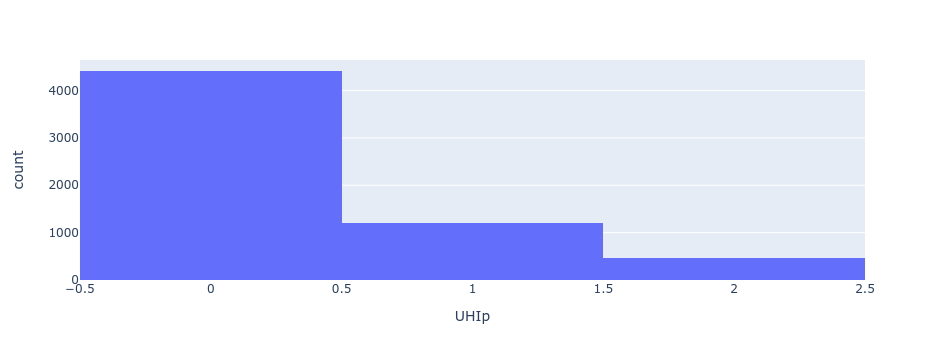

In [125]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (15,12)
fig = px.histogram(y, x ="UHIp")
fig.show()

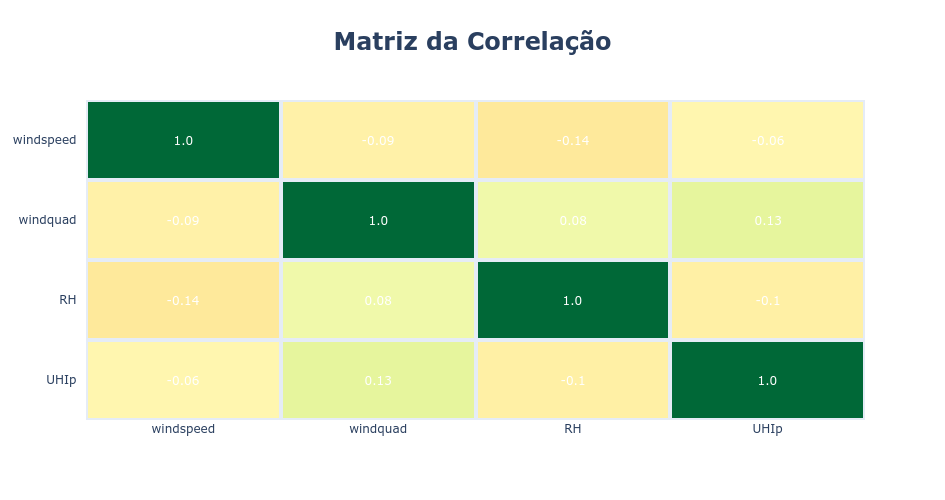

In [126]:
corr = df[feat+[target]].corr()
fig = ff.create_annotated_heatmap(
    z=corr.to_numpy().round(2),
    x=list(corr.index.values),
    y=list(corr.columns.values),
    xgap=4, ygap=4,
    zmin=-1, zmax=1, 
    colorscale='RdYlGn',
    colorbar_thickness=30,
    colorbar_ticklen=3,
)
fig.update_layout(title_text='<b>Matriz da Correlação<b>',
                  title_x=0.5,
                  titlefont={'size': 24},
                  width=700, height=500,
                  xaxis_showgrid=False,
                  xaxis={'side': 'bottom'},
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed',
                  paper_bgcolor=None,
)
fig.show()

In [127]:
Y = df[target]
X = df[feat]
Model = sm.OLS(Y, sm.add_constant(X))
Results = Model.fit()
print(Results.summary())

                            OLS Regression Results                            
Dep. Variable:                   UHIp   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     69.30
Date:                Thu, 25 Jan 2024   Prob (F-statistic):           4.66e-44
Time:                        16:58:56   Log-Likelihood:                -5565.5
No. Observations:                6075   AIC:                         1.114e+04
Df Residuals:                    6071   BIC:                         1.117e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2950      0.106     12.250      0.0

In [128]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")

coefficient of determination: 0.03310979159922012


In [129]:
model = LinearRegression().fit(X, y)
r_sq = model.score(X, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {model.intercept_}")
print(f"slope: {model.coef_}")

coefficient of determination: 0.03310979159922012
intercept: 1.2950470909924745
slope: [-0.01145681  0.03324782 -2.03890061]


In [130]:
import statsmodels.api as sm
x, y = np.array(df[feat]), np.array(df[target])
x = sm.add_constant(x)
model = sm.OLS(y, x)
results = model.fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     69.30
Date:                Thu, 25 Jan 2024   Prob (F-statistic):           4.66e-44
Time:                        16:58:56   Log-Likelihood:                -5565.5
No. Observations:                6075   AIC:                         1.114e+04
Df Residuals:                    6071   BIC:                         1.117e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2950      0.106     12.250      0.0

In [131]:
x = df[feat]
y = df[target]
x = sm.add_constant(x)
model = sm.OLS(y, x).fit()
predictions = model.predict(x)
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                   UHIp   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     69.30
Date:                Thu, 25 Jan 2024   Prob (F-statistic):           4.66e-44
Time:                        16:58:56   Log-Likelihood:                -5565.5
No. Observations:                6075   AIC:                         1.114e+04
Df Residuals:                    6071   BIC:                         1.117e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2950      0.106     12.250      0.0

In [132]:
X = df[feat+[target]].iloc[:, 1].values.reshape(-1, 1) # values converts it into a numpy array
Y = df[feat+[target]].iloc[:, 2].values.reshape(-1, 1) # -1 means that calculate the dimension of rows, but have 1 column
linear_regressor = LinearRegression() # create object for the class
linear_regressor.fit(X, Y) # perform linear regression
Y_pred = linear_regressor.predict(X) # make predictions

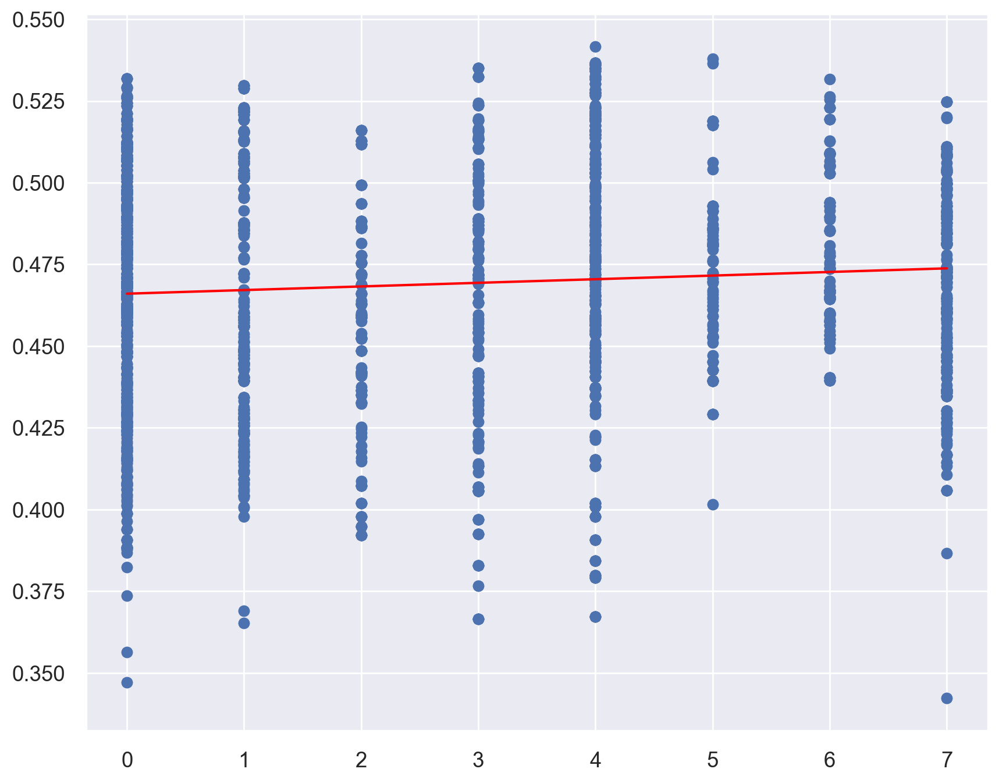

In [133]:
# Setting the boundaries and parameters
plt.rcParams['figure.figsize'] = (10,8)
plt.scatter(X, Y)
plt.plot(X, Y_pred, color='red')
plt.show()

In [134]:
y = df['windquad'].values.reshape(-1, 1)
X = df['UHIp'].values.reshape(-1, 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3,random_state = 42)

In [135]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)
print(regressor.intercept_)
print(regressor.coef_)

[2.42219874]
[[0.52083231]]


In [136]:
def calc(slope, intercept, UTFVI):
    return slope*UTFVI+intercept
score = calc(regressor.coef_, regressor.intercept_, .0022)
print(score)

[[2.42334457]]


In [137]:
# Passing 9.5 in double brackets to have a 2 dimensional array
score = regressor.predict([[0.0022]])
print(score)

[[2.42334457]]


In [138]:
y_pred = regressor.predict(X_test)
df_preds = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_preds)

      Actual  Predicted
0          3   2.422199
1          4   2.422199
2          5   2.422199
3          7   2.422199
4          0   2.422199
...      ...        ...
1818       6   2.943031
1819       5   2.422199
1820       0   2.422199
1821       4   2.943031
1822       2   2.422199

[1823 rows x 2 columns]


In [139]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f'Mean absolute error: {mae:.2f}')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')

Mean absolute error: 2.15
Mean squared error: 6.00
Root mean squared error: 2.45


In [140]:
print(df[feat + [target]].describe().round(2).T)

            count  mean   std   min   25%   50%   75%    max
windspeed  6075.0  6.68  3.37  0.11  4.23  6.38  8.73  23.16
windquad   6075.0  2.61  2.48  0.00  0.00  2.00  4.00   7.00
RH         6075.0  0.47  0.04  0.34  0.44  0.47  0.50   0.54
UHIp       6075.0  0.35  0.62  0.00  0.00  0.00  1.00   2.00


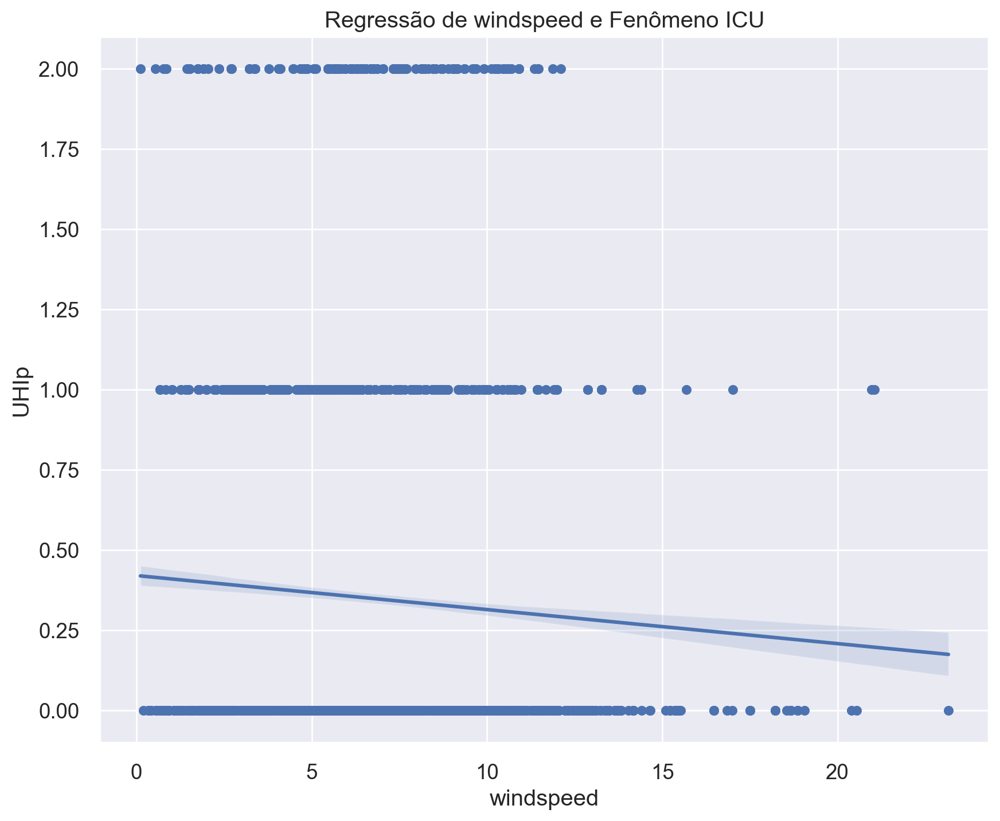

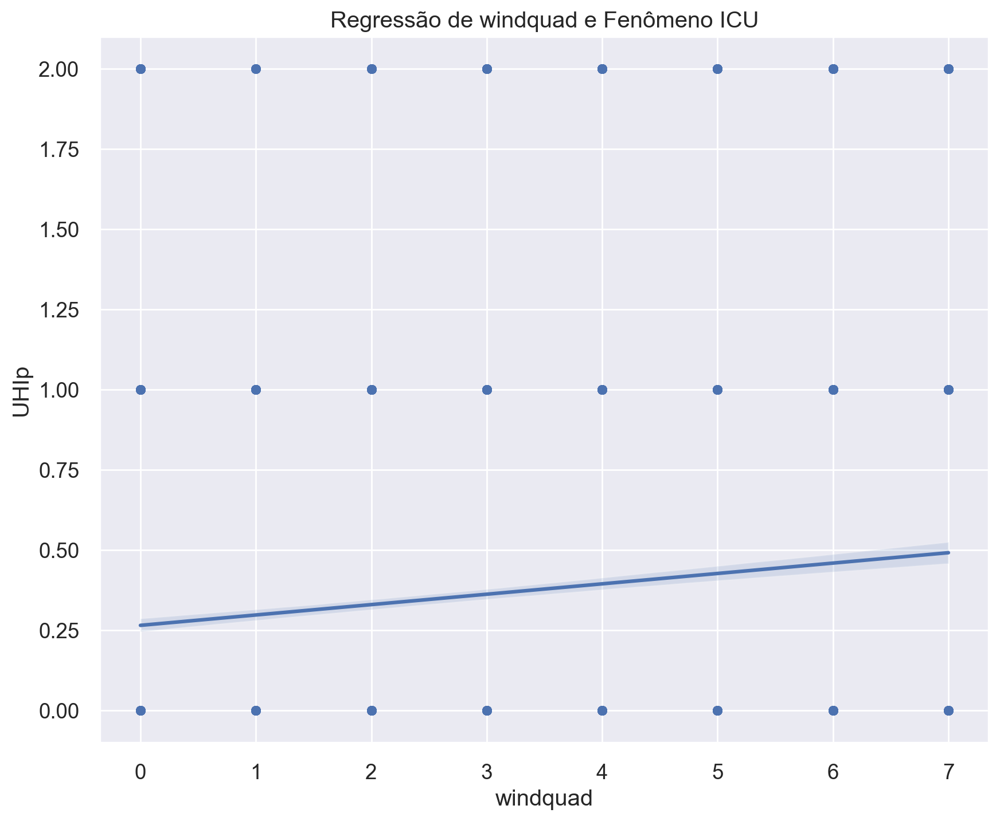

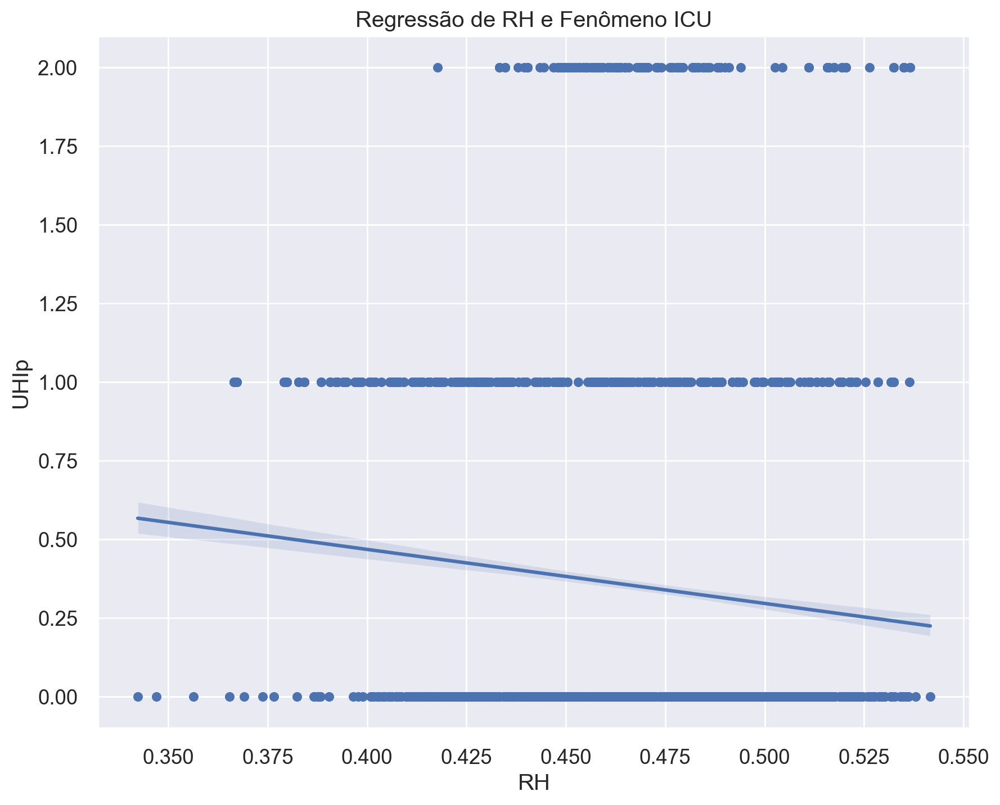

In [141]:
import seaborn as sns # Convention alias for Seaborn
variables = feat
for var in variables:
    plt.figure() # Creating a rectangle (figure) for each plot
    # Regression Plot also by default includes
    # best-fitting regression line
    # which can be turned off via `fit_reg=False`
    sns.regplot(x=var, y=target, data=df).set(title=f'Regressão de {var} e Fenômeno ICU');

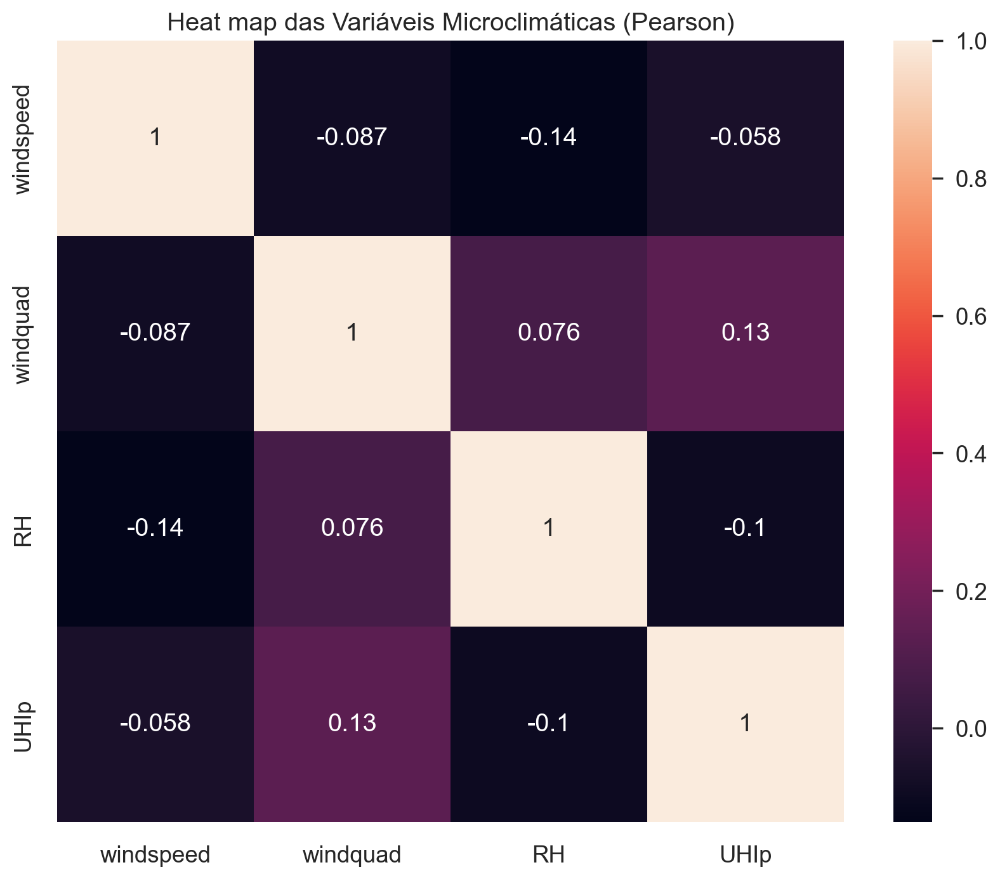

In [142]:
correlations = df[feat + [target]].corr()
# annot=True displays the correlation values
sns.heatmap(correlations, annot=True).set(title='Heat map das Variáveis Microclimáticas (Pearson)');

In [143]:
y = df[target]
X = df[feat]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [144]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)
print(regressor.intercept_)
print(regressor.coef_)

1.3122629970507211
[-0.0120065   0.03351844 -2.06459721]


In [145]:
feature_names = X.columns
model_coefficients = regressor.coef_
coefficients_df = pd.DataFrame(data = model_coefficients, 
                               index = feature_names,
                               columns = ['Coefficient value'])
print(coefficients_df)

           Coefficient value
windspeed          -0.012006
windquad            0.033518
RH                 -2.064597


In [146]:
y_pred = regressor.predict(X_test)
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results)

       Actual  Predicted
12124       0   0.378699
50757       0   0.276010
76576       0   0.476754
58525       0   0.429817
77395       0   0.359663
...       ...        ...
79531       1   0.578798
6362        0   0.428062
57323       0   0.130287
32586       1   0.413447
5822        0   0.392954

[1823 rows x 2 columns]


In [147]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f'Mean absolute error: {mae:.2f}')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')

Mean absolute error: 0.48
Mean squared error: 0.36
Root mean squared error: 0.60


In [148]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)
print(regressor.score(X_test, y_test))
print(regressor.score(X_train, y_train))

R²: 0.03152248279947023
0.0315224827994669
0.03357282597628375


In [149]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
tree_classifier = DecisionTreeClassifier(max_depth=int(md), random_state=random_state, max_features='auto', criterion='entropy')
tree_classifier.fit(df[features].values, df[target].values)

DecisionTreeClassifier(criterion='entropy', max_depth=8, max_features='auto',
                       random_state=42)

In [150]:
viz_model = dtreeviz.model(tree_classifier, 
                           X_train=df[features],
                           y_train=df[target],
                           feature_names=features,
                           target_name='Fenômeno ICU',
                           class_names=classes)
viz_model.view(scale=0.8)

In [151]:
from sklearn import decomposition, datasets
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
std_slc = StandardScaler()
pca = decomposition.PCA()
dec_tree = tree.DecisionTreeClassifier()
pipe = Pipeline(steps=[('std_slc', std_slc),
('pca', pca),
('dec_tree', dec_tree)])
n_components = list(range(1,X.shape[1]+1,1))
criterion = ['gini', 'entropy']
max_depth = [2,4,6,8,10,12]
parameters = dict(pca__n_components=n_components,
dec_tree__criterion=criterion,
dec_tree__max_depth=max_depth)

In [152]:
clf_GS = GridSearchCV(pipe, parameters)
clf_GS.fit(X, y)
print('Best Criterion:', clf_GS.best_estimator_.get_params()['dec_tree__criterion'])
print('Best max_depth:', clf_GS.best_estimator_.get_params()['dec_tree__max_depth'])
print('Best Number Of Components:', clf_GS.best_estimator_.get_params()['pca__n_components'])
print(); print(clf_GS.best_estimator_.get_params()['dec_tree'])

Best Criterion: gini
Best max_depth: 12
Best Number Of Components: 3

DecisionTreeClassifier(max_depth=12)


In [153]:
from sklearn.model_selection import GridSearchCV
param_grid = {'max_features': ['sqrt', 'log2'],
'ccp_alpha': [0.1, .01, .001],
'max_depth' : [5, 6, 7, 8, 9],
'criterion' :['gini', 'entropy']
}
tree_clas = DecisionTreeClassifier(random_state=42)

In [154]:
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, y_train)
final_model = grid_search.best_estimator_
final_model

Fitting 5 folds for each of 60 candidates, totalling 300 fits


DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=9,
                       max_features='sqrt', random_state=42)

In [155]:
#Training the model
tree_clas = DecisionTreeClassifier(ccp_alpha=0.01, class_weight=None, criterion='entropy',
max_depth=9, max_features='sqrt', max_leaf_nodes=None,
min_impurity_decrease=0.0,
min_samples_leaf=1, min_samples_split=2,
min_weight_fraction_leaf=0.0,
random_state=42, splitter='best')
tree_clas.fit(X_train, y_train)
y_predict = tree_clas.predict(X_test)
y_predict

array([0, 0, 0, ..., 0, 0, 0])

In [156]:
actual_minus_predicted = sum((y_test - y_pred)**2)
actual_minus_actual_mean = sum((y_test - y_test.mean())**2)
r2 = 1 - actual_minus_predicted/actual_minus_actual_mean
print('R²:', r2)

R²: 0.03152248279947023


In [157]:
import xgboost
import shap

model = xgboost.XGBClassifier(n_estimators=20)
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=20, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

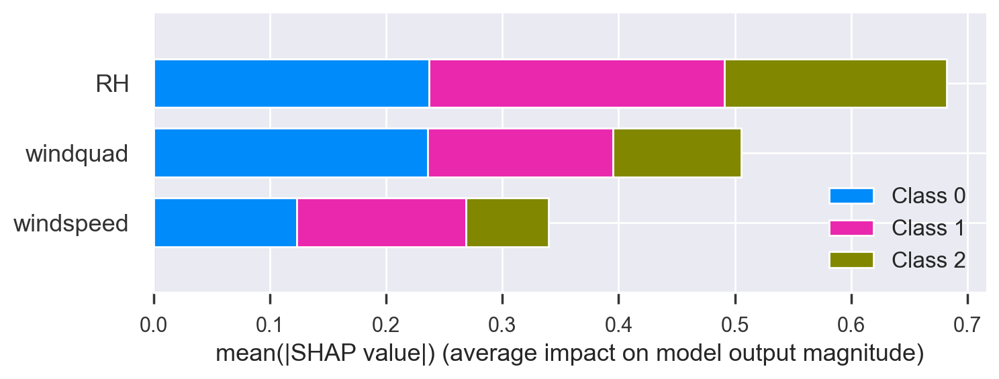

In [158]:
# equilibrated case
background = X.sample(1000) #X is equilibrated# background used in explainer defines base value
explainer = shap.TreeExplainer(model,background,model_output="raw" )
shap_values = explainer.shap_values(X)# background used in the plot, the points that are visible on the plot
shap.summary_plot(shap_values,background, feature_names=background.columns)

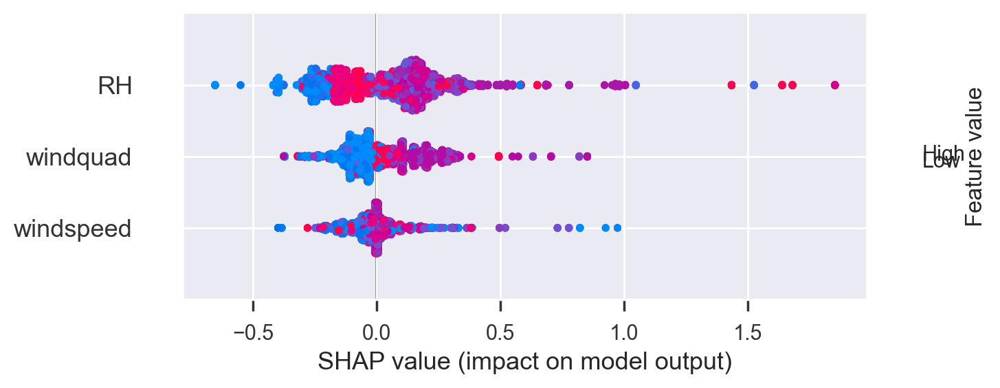

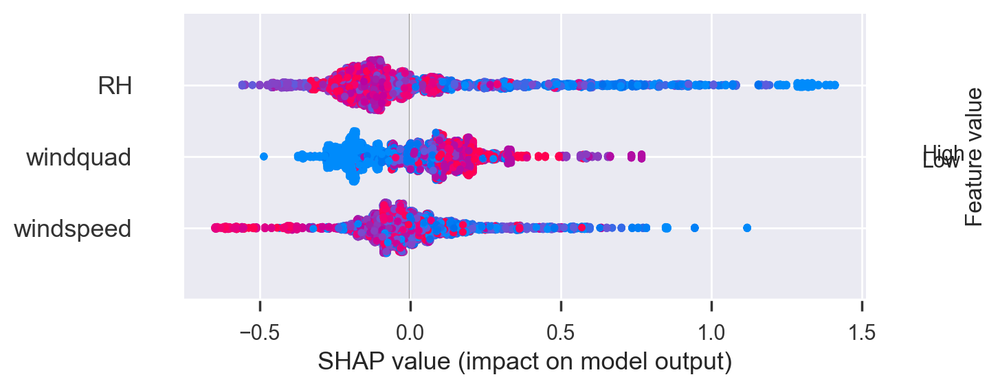

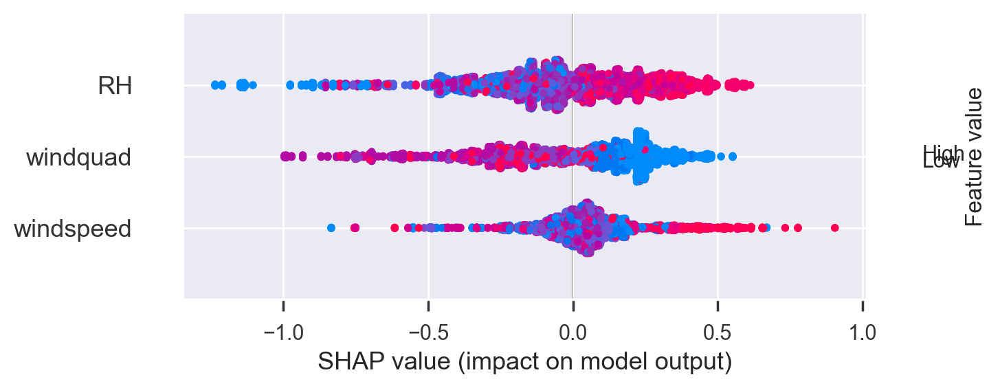

In [159]:
shap.summary_plot(shap_values[2], X)
shap.summary_plot(shap_values[1], X)
shap.summary_plot(shap_values[0], X)

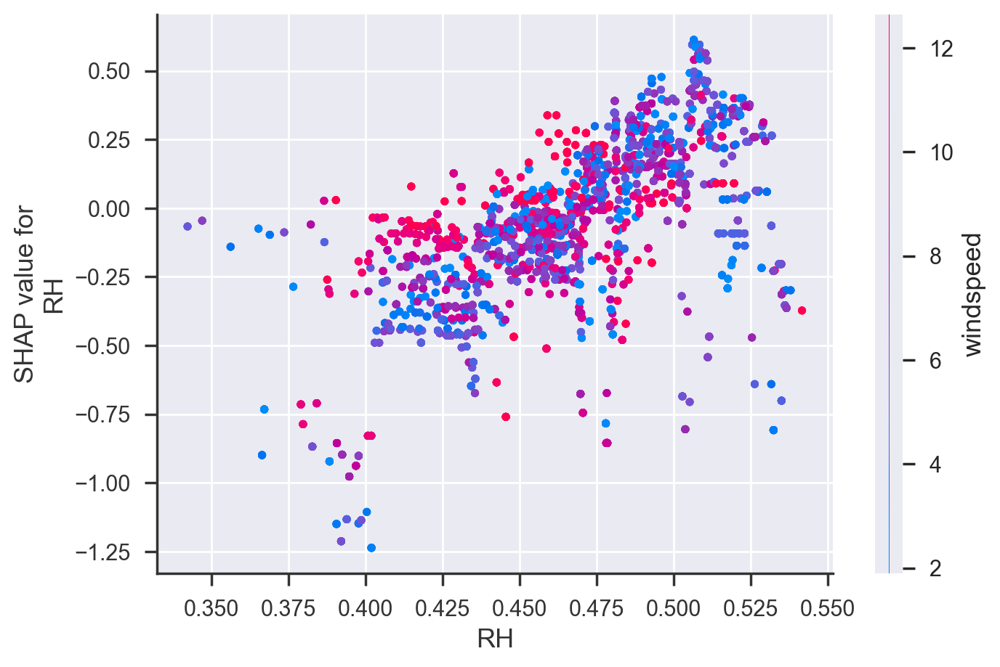

In [161]:
# shap.dependence_plot(“alcohol”, shap_values, X_train)
shap.dependence_plot("RH", shap_values[0], X)

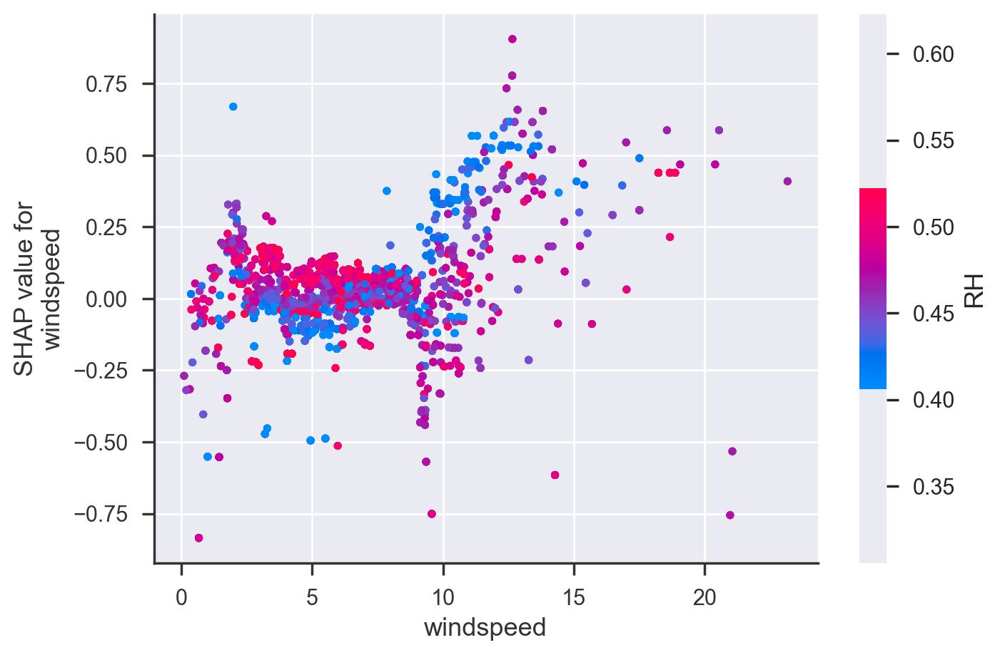

In [162]:
shap.dependence_plot('windspeed', shap_values[0], X, interaction_index="RH")

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[0], X)

In [ ]:
# shap.initjs()
columIndex= 2
shap.force_plot(explainer.expected_value[1], shap_values[1][columIndex,:], X.iloc[columIndex,:], link="logit")

In [ ]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)
print(X_train.shape)

In [ ]:
clf = RandomForestClassifier(n_estimators=500, max_depth=8)
clf.fit(X_train, y_train)

In [ ]:
explainer = shap.TreeExplainer(clf)
shap_values = np.array(explainer.shap_values(X_train))
print(shap_values.shape)

In [ ]:
shap_values_ = shap_values.transpose((1,0,2))

np.allclose(
    clf.predict_proba(X_train),
    shap_values_.sum(2) + explainer.expected_value
)

In [ ]:
shap.summary_plot(shap_values[0],X_train)

In [ ]:
rf = RandomForestClassifier(n_estimators=500, max_depth=8, random_state=42, max_features='sqrt', class_weight='balanced')
rf.fit(X_train, y_train)

# Make predictions for the test set
y_pred_test = rf.predict(X_test)

# Print accuracy for the training and test sets
print("Accuracy on training set: {:.3f}".format(rf.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(rf.score(X_test, y_test)))

In [ ]:
# View confusion matrix for test data and predictions
confusion_matrix(y_test, y_pred_test)

In [ ]:
print(classification_report(y_test, y_pred_test))

In [ ]:
recall_score(y_test, y_pred_test, average=None)[0]

In [ ]:
precision_score(y_test, y_pred_test, average=None)[0]

In [ ]:
from quantile_forest import RandomForestQuantileRegressor
from sklearn.model_selection import train_test_split

qrf = RandomForestQuantileRegressor(random_state=0)
qrf.fit(X_train, y_train)

# Get the training indices for tree=0, leaf=18683.
y_train_leaves = np.asarray(qrf.forest_.y_train_leaves)
train_indices = y_train_leaves[0, 2, :] - 1
train_indices = train_indices[train_indices >= 0]

# Get the training response values for the training indices
print(np.array(qrf.forest_.y_train)[train_indices])


In [ ]:
y_train_leaves.shape

In [ ]:
# n_trees, n_nodes, _ = y_train_leaves.shape
# for tree_i in range(n_trees):
#     for node_j in range(n_nodes):
#         train_indices_ij = y_train_leaves[tree_i, node_j] - 1
#         train_indices_ij = train_indices_ij[train_indices_ij >= 0]
#         print(np.array(qrf.forest_.y_train)[train_indices_ij])

In [ ]:

from sklearn.model_selection import train_test_split # for splitting the data into train and test samples
from sklearn.metrics import classification_report # for model evaluation metrics
from sklearn import tree # for decision tree models

import plotly.express as px  # for data visualization
import plotly.graph_objects as go # for data visualization
import graphviz # for plotting decision tree graphs


In [ ]:
def fitting(X, y, criterion, splitter, mdepth, clweight, minleaf):

    # Create training and testing samples
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Fit the model
    model = tree.DecisionTreeClassifier(criterion=criterion, 
                                        splitter=splitter, 
                                        max_depth=mdepth,
                                        class_weight=clweight,
                                        min_samples_leaf=minleaf, 
                                        random_state=42, 
                                  )
    clf = model.fit(X_train, y_train)

    # Predict class labels on training data
    pred_labels_tr = model.predict(X_train)
    # Predict class labels on a test data
    pred_labels_te = model.predict(X_test)

    # Tree summary and model evaluation metrics
    print('*************** Tree Summary ***************')
    print('Classes: ', clf.classes_)
    print('Tree Depth: ', clf.tree_.max_depth)
    print('No. of leaves: ', clf.tree_.n_leaves)
    print('No. of features: ', clf.n_features_in_)
    print('--------------------------------------------------------')
    print("")
    
    print('*************** Evaluation on Test Data ***************')
    score_te = model.score(X_test, y_test)
    print('Accuracy Score: ', score_te)
    # Look at classification report to evaluate the model
    print(classification_report(y_test, pred_labels_te))
    print('--------------------------------------------------------')
    print("")
    
    print('*************** Evaluation on Training Data ***************')
    score_tr = model.score(X_train, y_train)
    print('Accuracy Score: ', score_tr)
    # Look at classification report to evaluate the model
    print(classification_report(y_train, pred_labels_tr))
    print('--------------------------------------------------------')
    
    # Use graphviz to plot the tree
    dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=X.columns, 
                                class_names=[str(list(clf.classes_)[0]), str(list(clf.classes_)[1])],
                                filled=True, 
                                rounded=True, 
                                #rotate=True,
                               ) 
    graph = graphviz.Source(dot_data)
    
    # Return relevant data for chart plotting
    return X_train, X_test, y_train, y_test, clf, graph

In [ ]:
# Fit the model and display results
X_train, X_test, y_train, y_test, clf, graph = fitting(X, y, 'entropy', 'best', 
                                                       mdepth=8, 
                                                       clweight=None,
                                                       minleaf=1000)

# Plot the tree graph
graph

# Save tree graph to a PDF
#graph.render('Decision_Tree_all_vars_gini')

In [ ]:
# Fit the model and display results
X_train, X_test, y_train, y_test, clf, graph = fitting(X, y, 'entropy', 'best', 
                                                       mdepth=8, 
                                                       clweight=None, 
                                                       minleaf=1000)

# Plot the tree graph
graph

In [ ]:
# !pip install pycaret

In [ ]:
# from pycaret.classification import *
# s = setup(data = df[feat], target = df['UHIp'], session_id=123)

In [ ]:
# best_model = compare_models()

In [ ]:
# dt = create_model('rf')

In [ ]:
# print(dt)

In [ ]:
df[target]

In [ ]:
df2 = df[['windspeed', 'windquad', 'RH','UHIp']]
df2

In [ ]:
# Distribution of all parameters wrt price.
nr_rows = 2
nr_cols = 2

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*4,nr_rows*4))
numerical_feats = df2.dtypes[df2.dtypes != "object"].index
li_num_feats = list(numerical_feats)
li_not_plot = ['id']
li_plot_num_feats = [c for c in list(numerical_feats) if c not in li_not_plot]
for r in range(0,nr_rows):
    for c in range(0,nr_cols):  
        i = r*nr_cols+c
        if i < len(li_plot_num_feats):
            sns.regplot(x = df[['windspeed', 'windquad', 'RH','UHIp']][li_plot_num_feats[i]], y= df['UHIp'], ax = axs[r][c])
            stp = stats.pearsonr(df2[li_plot_num_feats[i]], df2['UHIp'])
            str_title = "r = " + "{0:.2f}".format(stp[0]) + "      " "p = " + "{0:.2f}".format(stp[1])
            axs[r][c].set_title(str_title,fontsize=11)
            
plt.tight_layout()    
sns.set(color_codes=True)
plt.show()   

In [ ]:
# Features having coorelation to price
sns.set(color_codes=True)
df2.corrwith(df2.UHIp).plot.bar( figsize = (12, 5), title = "Correlação em função do UTFVI", fontsize = 15, rot = 90, grid = True);


In [ ]:
df2[li_plot_num_feats[2]]

In [ ]:
import folium
import warnings
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from folium.plugins import HeatMap

folds  = 5

sns.set(color_codes=True)

warnings.filterwarnings("ignore", category=FutureWarning)

from sklearn.metrics import r2_score
# from ml_metrics import rmse
from scipy import stats
from sklearn.model_selection import GridSearchCV
score_calc = 'neg_mean_squared_error'

In [ ]:
house_price_data = pd.read_csv("../kc_house_data.csv")
house_price_data = house_price_data.drop(["date","id"], axis = 1)

In [ ]:
house_price_data

In [ ]:
# Distribution of all parameters wrt price.
nr_rows = 3
nr_cols = 6

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*4,nr_rows*4))

numerical_feats = house_price_data.dtypes[house_price_data.dtypes != "object"].index

li_num_feats = list(numerical_feats)
li_not_plot = ['id']
li_plot_num_feats = [c for c in list(numerical_feats) if c not in li_not_plot]

for r in range(0,nr_rows):
    for c in range(0,nr_cols):  
        i = r*nr_cols+c
        if i < len(li_plot_num_feats):
            sns.regplot(x= house_price_data[li_plot_num_feats[i]], y=house_price_data['price'],ax = axs[r][c])
            stp = stats.pearsonr(house_price_data[li_plot_num_feats[i]], house_price_data['price'])
            str_title = "r = " + "{0:.2f}".format(stp[0]) + "      " "p = " + "{0:.2f}".format(stp[1])
            axs[r][c].set_title(str_title,fontsize=11)
            
plt.tight_layout()    
sns.set(color_codes=True)
plt.show()   

In [ ]:
# Features having coorelation to price
sns.set(color_codes=True)
house_price_data.corrwith(house_price_data.price).plot.bar( figsize = (12, 5), title = "Correlation with respect to Prices", fontsize = 15, rot = 90, grid = True);


In [ ]:
import statsmodels.formula.api as smf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy import stats
from sklearn.linear_model import LinearRegression
from statsmodels.graphics.factorplots import interaction_plot

In [ ]:
results = smf.ols('skinTemp ~ RH + windspeed + windquad', data=df).fit()
table = sm.stats.anova_lm(results, typ=1)
table

In [ ]:
print(results.summary())

In [ ]:
df.dtypes

In [ ]:
# two variables of interest
sample_df = df[['Temp2m', 'RH','windspeed','windquad']]
groups = sample_df.groupby('windquad').count().reset_index()

In [ ]:
# Create ANOVA backbone table
data = [['Entre grupos', '', '', '', '', '', ''], ['Dentro dos Grupos', '', '', '', '', '', ''], ['Total', '', '', '', '', '', '']] 
anova_table = pd.DataFrame(data, columns = ['Fonte da Variação', 'SS', 'df', 'MS', 'F', 'P-value', 'F crit']) 
anova_table.set_index('Fonte da Variação', inplace = True)

# calculate SSTR and update anova table
x_bar = df['Temp2m'].mean()
SSTR = sample_df.groupby('windquad').count() * (sample_df.groupby('windquad').mean() - x_bar)**2
anova_table['SS']['Entre grupos'] = SSTR['Temp2m'].sum()

# calculate SSE and update anova table
SSE = (sample_df.groupby('windquad').count() - 1) * sample_df.groupby('windquad').std()**2
anova_table['SS']['Dentro dos Grupos'] = SSE['Temp2m'].sum()

# calculate SSTR and update anova table
SSTR = SSTR['Temp2m'].sum() + SSE['Temp2m'].sum()
anova_table['SS']['Total'] = SSTR

# update degree of freedom
anova_table['df']['Entre grupos'] = sample_df['windquad'].nunique() - 1
anova_table['df']['Dentro dos Grupos'] = sample_df.shape[0] - sample_df['windquad'].nunique()
anova_table['df']['Total'] = sample_df.shape[0] - 1

# calculate MS
anova_table['MS'] = anova_table['SS'] / anova_table['df']

# calculate F 
F = anova_table['MS']['Entre grupos'] / anova_table['MS']['Dentro dos Grupos']
anova_table['F']['Entre grupos'] = F

# p-value
anova_table['P-value']['Entre grupos'] = 1 - stats.f.cdf(F, anova_table['df']['Entre grupos'], anova_table['df']['Dentro dos Grupos'])

# F critical 
alpha = 0.05
# possible types "right-tailed, left-tailed, two-tailed"
tail_hypothesis_type = "two-tailed"
if tail_hypothesis_type == "two-tailed":
    alpha /= 2
anova_table['F crit']['Entre grupos'] = stats.f.ppf(1-alpha, anova_table['df']['Entre grupos'], anova_table['df']['Dentro dos Grupos'])

# Final ANOVA Table
anova_table

## Verificação de suposição de homogeneidade de variância

In [ ]:
# calcular a proporção do maior para o menor desvio padrão da amostra
ratio = sample_df.groupby('windquad').std().max() / sample_df.groupby('windquad').std().min()
ratio

In [ ]:
import numpy as np 
import scipy.stats as stats
import matplotlib.pyplot as plt

unique_majors = sample_df['windquad'].unique()
for major in unique_majors:
    stats.probplot(sample_df[sample_df['windquad'] == major]['Temp2m'], dist="norm", plot=plt)
    plt.title("Probabilidade- Temperatura do ar (2m) e Direção do Vento (quadrante) " +  major.astype(str))
    plt.show()

# Testando hipóteses

## De acordo com o processo de cinco etapas de teste de hipóteses:
## H₀: μ₁= μ₂ = μ₃ =… = μ₆
## H₁: Nem todas as médias das temperaturas são iguais
## α = 0,05
## De acordo com as estatísticas do teste F:

In [ ]:
# The p-value approach
print("Abordagem 1: A abordagem do valor p para testes de hipóteses na regra de decisão")
conclusion = "Falha ao rejeitar a hipótese nula."
if anova_table['P-value']['Entre grupos'] <= alpha:
    conclusion = "Hipótese nula foi rejeitada."
print("F-score é:", anova_table['F']['Entre grupos'], " e p value é:", anova_table['P-value']['Entre grupos'])    
print(conclusion)
    
# The critical value approach
print("\n--------------------------------------------------------------------------------------")
print("Abordagem 2: A abordagem do valor crítico para testes de hipóteses na regra de decisão")
conclusion = "Falha ao rejeitar a hipótese nula."
if anova_table['F']['Entre grupos'] > anova_table['F crit']['Entre grupos']:
    conclusion = "Hipótese nula foi rejeitada."
print("F-score é:", anova_table['F']['Entre grupos'], " e valor crítico é:", anova_table['F crit']['Entre grupos'])
print(conclusion)